In [1]:
%load_ext autoreload
%autoreload 2
import tensorflow as tf
from tensorflow.python.ops import array_ops
import numpy as np
import matplotlib.pyplot as plt
import processes
from processes import orstein_uhlenbeck as ou
import utils
from utils import kalman
import buildingblocks
from buildingblocks import stupidcell

/Users/apple/anaconda3/envs/DeepLearning/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: compiletime version 3.6 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.5
  return f(*args, **kwds)
/Users/apple/anaconda3/envs/DeepLearning/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


## Network

In [2]:
def build_optimizer(loss, learning_rate, grad_clip):
    ''' Build optmizer for training, using gradient clipping.
    
        Arguments:
        loss: Network loss
        learning_rate: Learning rate for optimizer
    
    '''
    
    # Optimizer for training, using gradient clipping to control exploding gradients
    tvars = tf.trainable_variables()
    grads, _ = tf.clip_by_global_norm(tf.gradients(loss, tvars), grad_clip)
    train_op = tf.train.AdamOptimizer(learning_rate)
    optimizer = train_op.apply_gradients(zip(grads, tvars))
    
    return optimizer

In [3]:

graph=tf.Graph()


In [4]:
logs_dir = './graphs/'
batch_size=128
num_steps=1095
lstm_layers= 1
lstm_size= 10
inputs_dim= 1
alpha = 0.1

In [5]:
with graph.as_default():
    inputs_ = tf.placeholder( tf.float32, [batch_size,num_steps, inputs_dim] , name='inputs')
    targets_ = tf.placeholder( tf.float32, [batch_size,num_steps, inputs_dim] , name='targets')
    learning_rate= tf.placeholder( tf.float32 , name='lr')
    grad_clip= tf.placeholder( tf.float32 , name='clip')

In [6]:

with graph.as_default():
    cell = stupidcell.StupidRNNCell(1,activation= None)
    stupidlstm = stupidcell.StupidLSTMCell(lstm_size)
    '''
    lstm = tf.contrib.rnn.BasicLSTMCell(lstm_size)
    lstm= tf.contrib.rnn.MultiRNNCell([lstm,stupidlstm])
    '''
    lstm= stupidlstm
    W = tf.Variable(tf.random_normal([lstm_size, lstm_size]), dtype=tf.float32) # weights
    b = tf.Variable(tf.random_normal([ lstm_size]), dtype=tf.float32)
    def residual_wrapper( i,o):
        out = tf.matmul( o, W)+b
        out = tf.sigmoid( out)
        return array_ops.concat([i,out],1)
    lstm = tf.contrib.rnn.ResidualWrapper( lstm, (lambda i, o: array_ops.concat([i,o],1)) )
    
    rnn_cell = tf.contrib.rnn.MultiRNNCell([lstm,cell])
# 'outputs' is a tensor of shape [batch_size, max_time, cell_state_size]

# defining initial state
    initial_state = rnn_cell.zero_state(batch_size, dtype=tf.float32)

# 'state' is a tensor of shape [batch_size, cell_state_size]
    outputs, state = tf.nn.dynamic_rnn(rnn_cell, inputs_,
                                   initial_state=initial_state,
                                   dtype=tf.float32)
    '''
    W = tf.Variable(tf.random_normal([lstm_size, inputs_dim]), dtype=tf.float32) # weights
    b = tf.Variable(tf.random_normal([ inputs_dim]), dtype=tf.float32) # biases
    shape = outputs.shape
    
    outputs = tf.matmul( tf.reshape( outputs, [-1, lstm_size]), W ) + b
    outputs = tf.reshape( outputs, (shape[0],shape[1],b.shape[0]))
    '''


(128, 2)


In [7]:
with graph.as_default():
    square=  tf.reduce_mean( tf.square( outputs - targets_),axis=0 )
    shape = square.shape
    square = tf.reshape(square, [shape[0],])
    def power(x):
        alpha =0.96
        return (1-alpha)*tf.pow(alpha,x)
    weights = tf.map_fn(  power, tf.range( start= shape[0]-1, delta=-1., limit= -0.5  ) )
    cost = tf.losses.compute_weighted_loss( square, weights )
    optimizer= build_optimizer(cost, learning_rate, grad_clip)
    

## Batch

In [8]:


def batch_1( batch_size, num_steps, noise, dictionary,):
    while True:
        invariant_std = 0.3 +0.6*np.random.rand()
        rand = np.random.rand()
        lbd = 10**( 2*rand**2 -1 )
        sigma = invariant_std*np.sqrt(2*lbd)
        dictionary['sigma'] = sigma
        dictionary['lbd'] = lbd

        batch = np.random.randn( batch_size,num_steps+1,1)*noise
        trend =np.reshape( ou.process(**dictionary)[: num_steps+1] , [-1,1] )
        for i in range(batch_size):
            batch[i,:,:]=batch[i,:,:]+trend[:,:]
        
        yield (batch[:,:-1,:] , batch[:,1:,:],trend, dictionary )

    

In [9]:
invariant_std = 0.2
lbd = 1.
sigma = invariant_std*np.sqrt(2*lbd)
start= 365
dictionary = {'deltaT': 1./365,
              'T':3}
noise= 0.1/np.sqrt( dictionary['deltaT'])
generator1 = batch_1( batch_size , num_steps,noise ,dictionary)

In [10]:
generator= generator1

## Training

## Batch 1

-3.6465450242161763


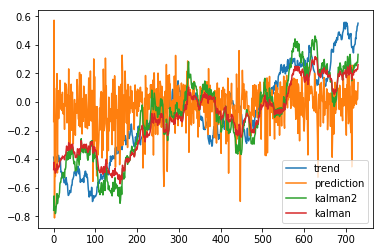

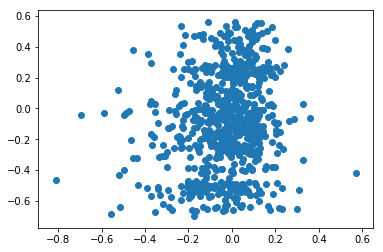

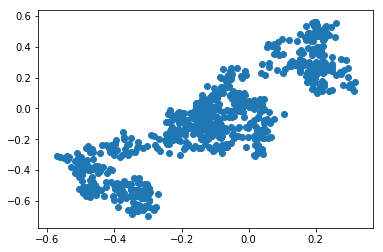

-3.646349209919573


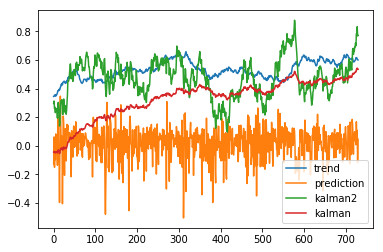

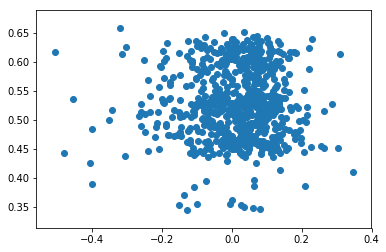

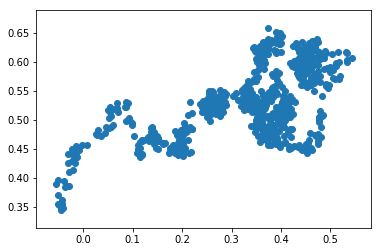

-3.6466020467691136


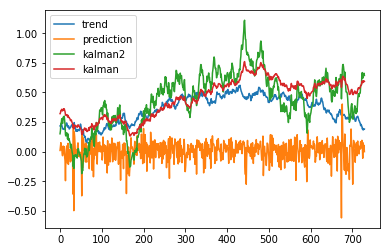

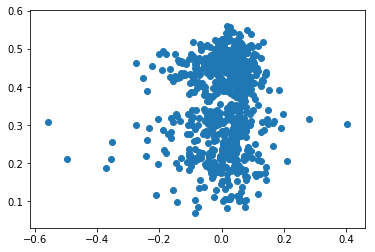

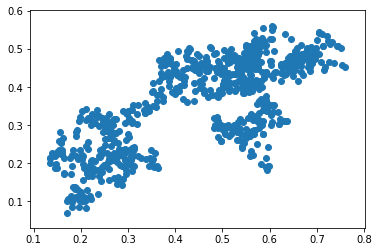

-3.6466935957781983


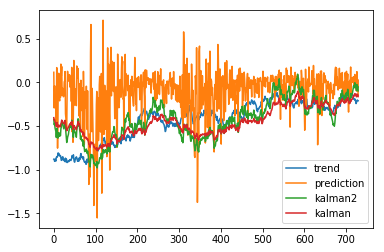

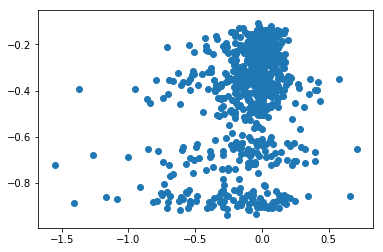

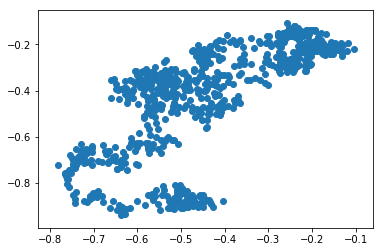

-3.6456504493020487


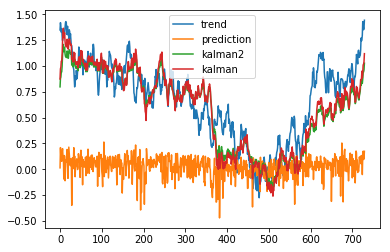

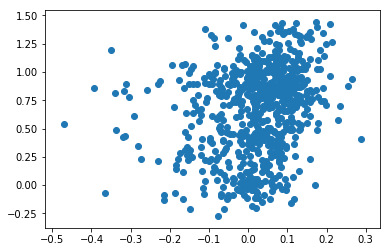

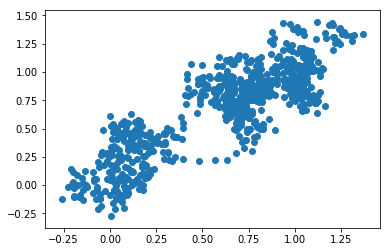

-3.646505055110903


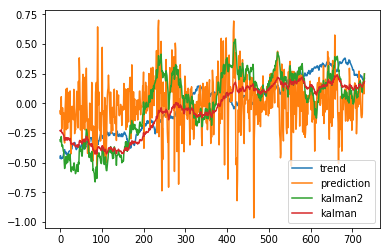

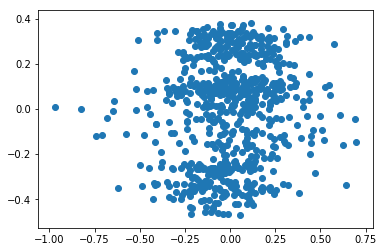

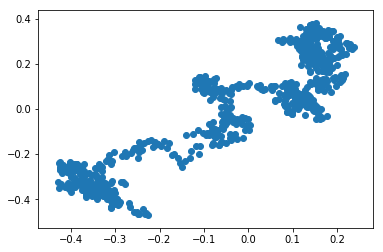

-3.646557177975775


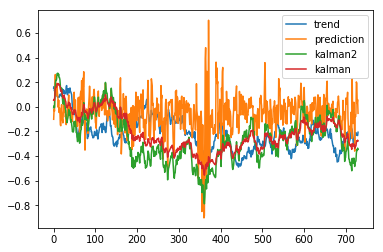

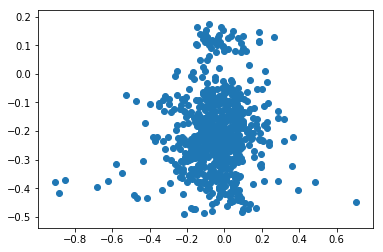

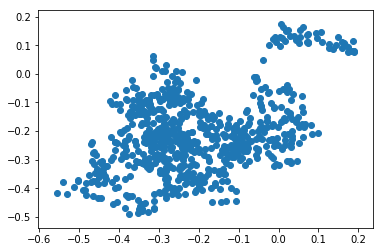

-3.6466930449008954


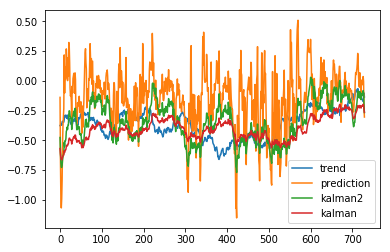

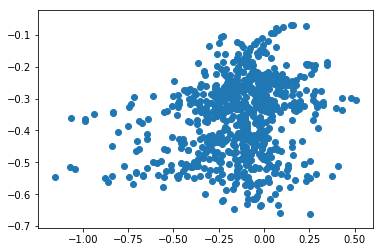

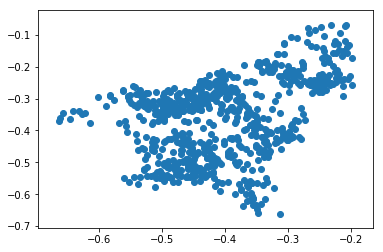

-3.6467710475903017


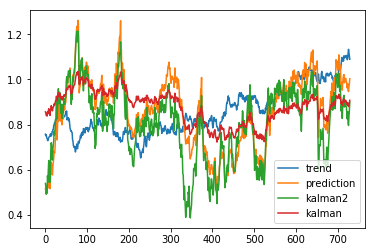

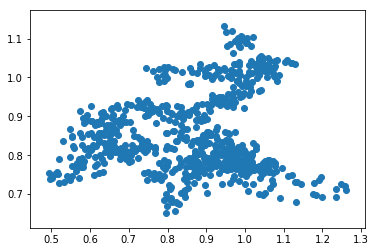

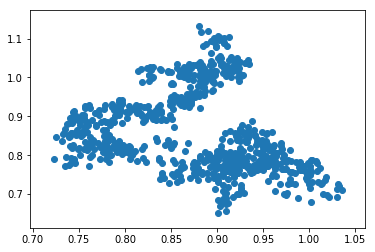

-3.646617329772563


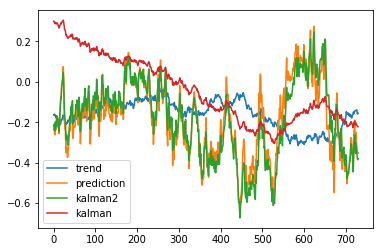

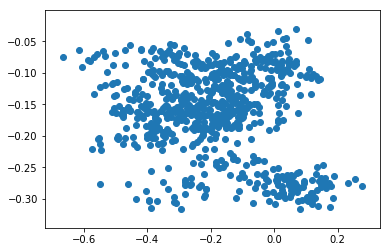

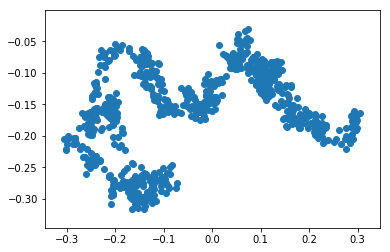

-3.6466158235911292


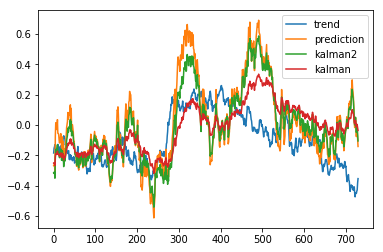

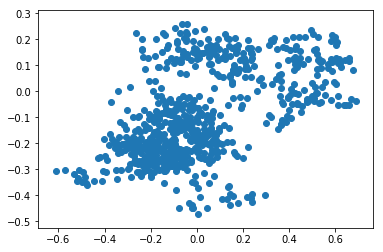

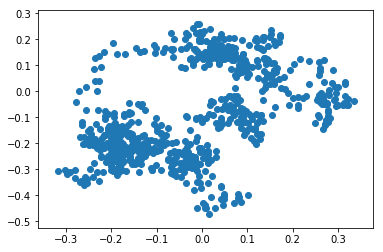

-3.646645407518373


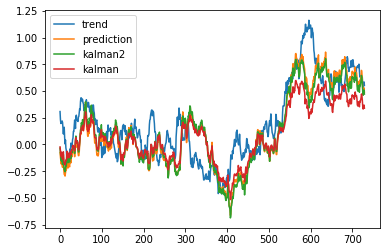

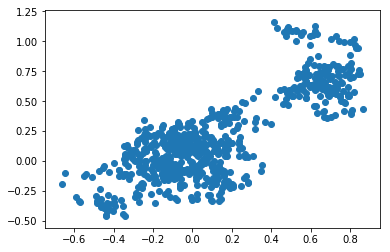

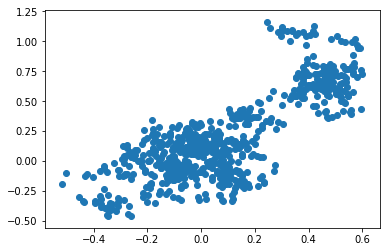

-3.6465037845540804


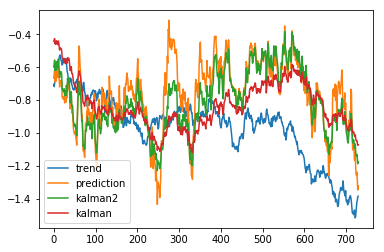

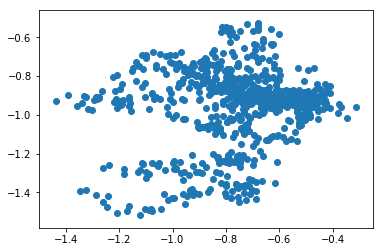

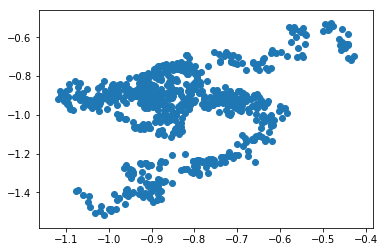

-3.646552044991405


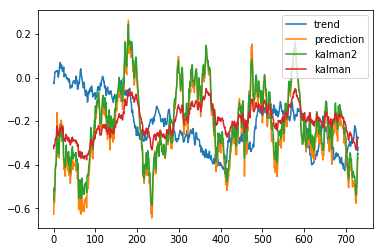

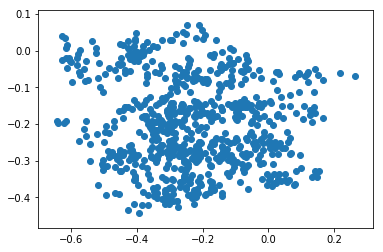

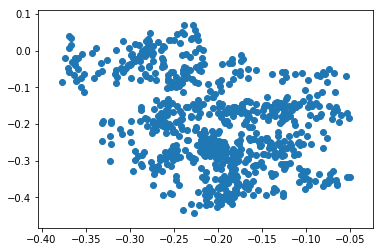

-3.6465897332876933


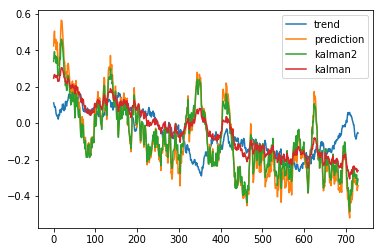

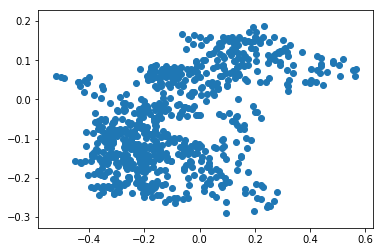

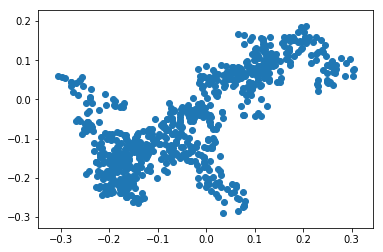

-3.646634452370928


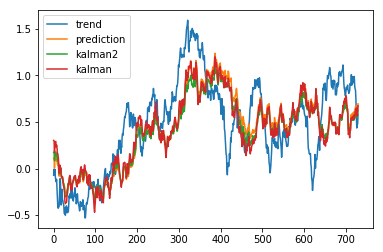

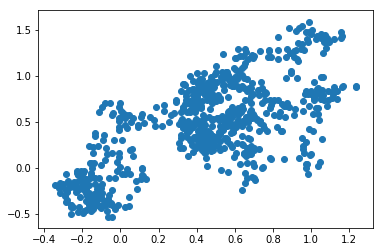

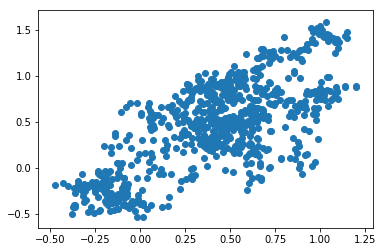

-3.6466841752175254


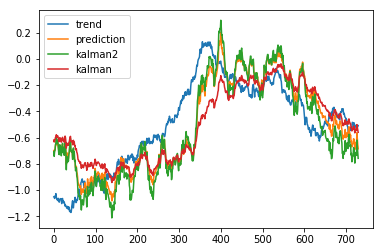

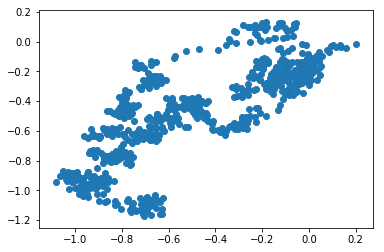

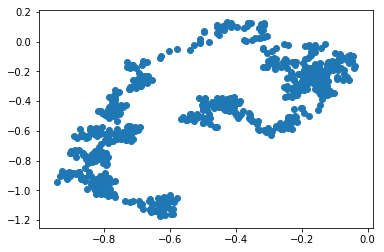

-3.646632516384126


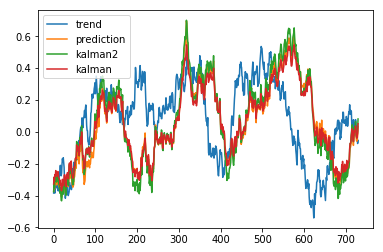

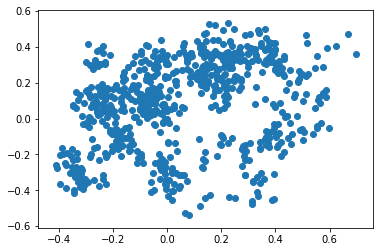

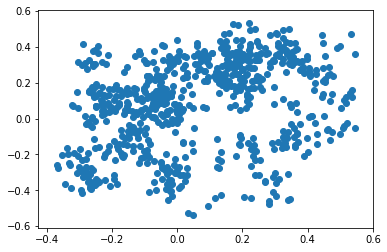

-3.6467350736260427


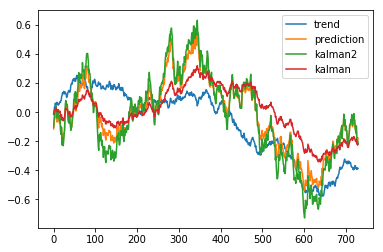

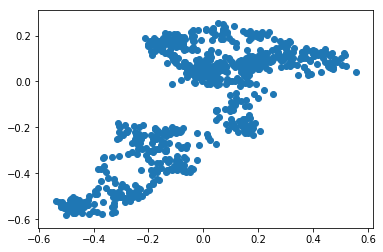

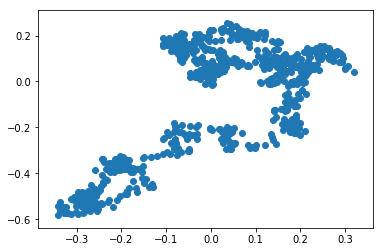

-3.646665722690524


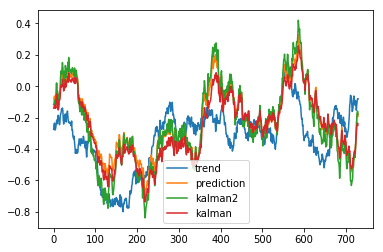

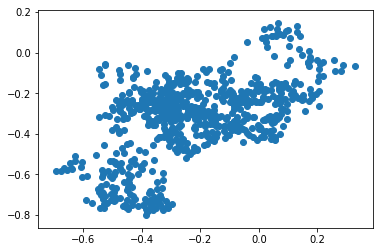

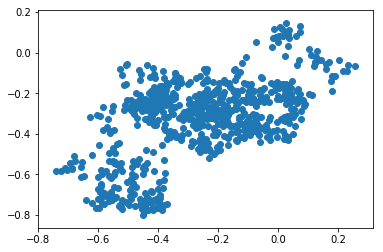

-3.646710080886261


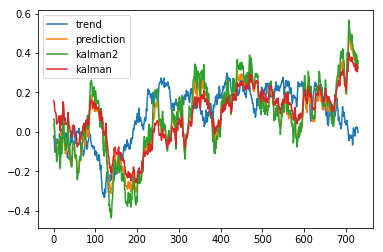

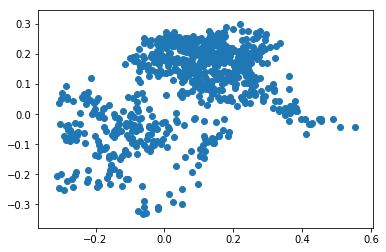

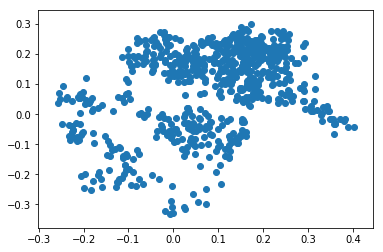

-3.6464626724831772


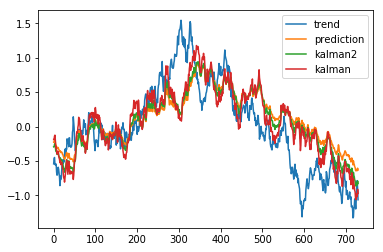

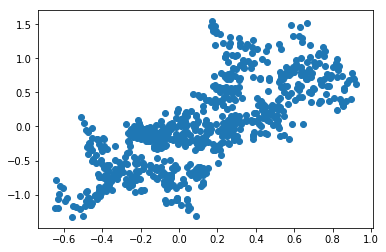

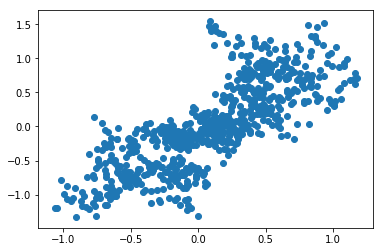

-3.646699984883891


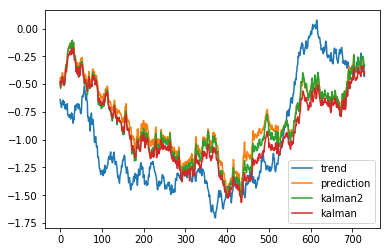

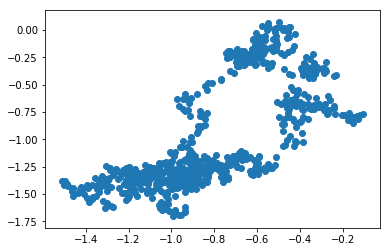

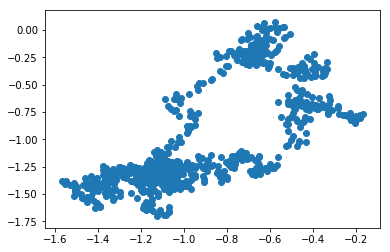

-3.646109983418138


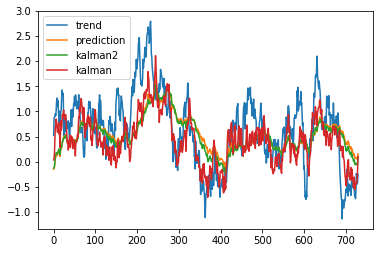

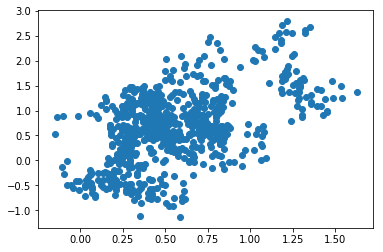

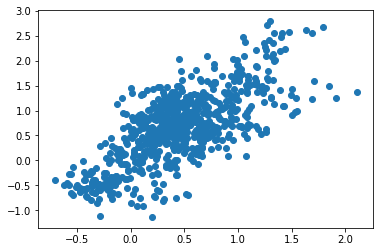

-3.6464458469767136


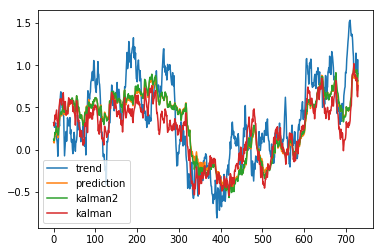

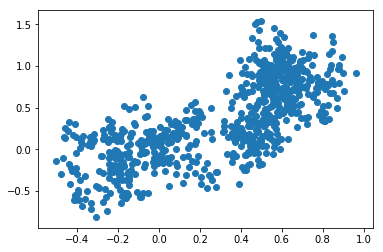

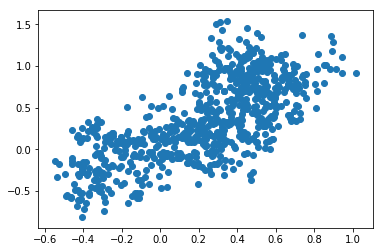

-3.6466917654965085


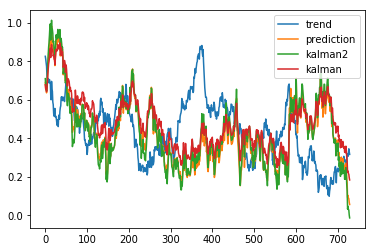

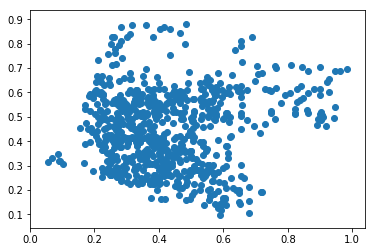

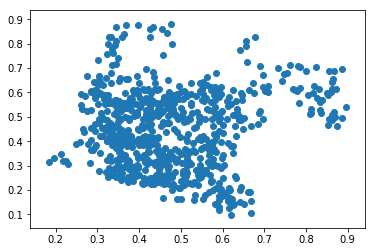

-3.6466622188221676


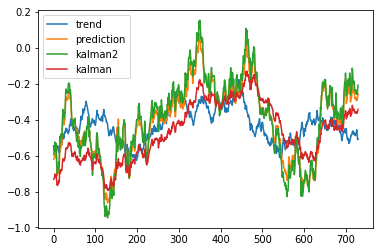

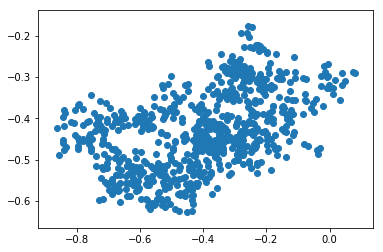

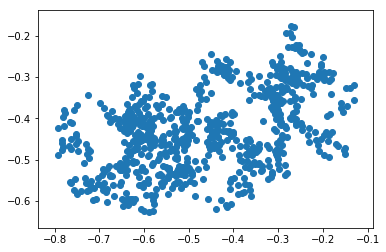

-3.646607811190189


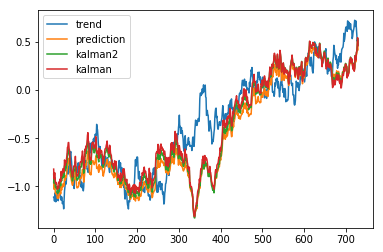

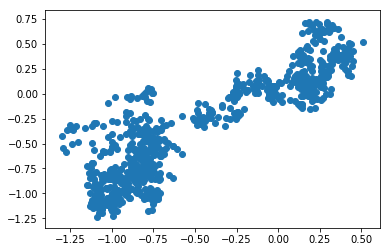

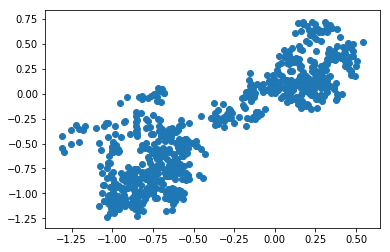

-3.6464552053716046


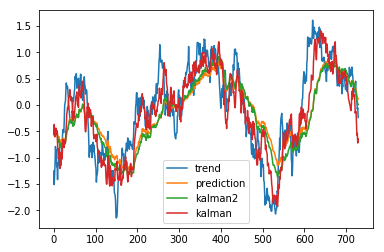

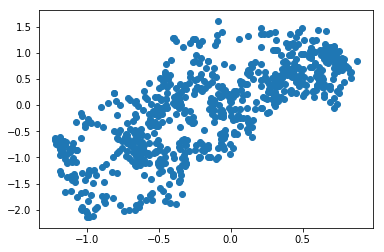

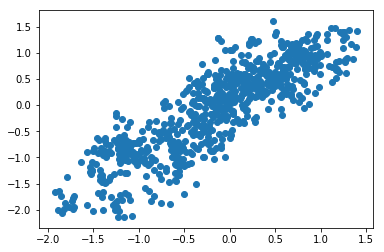

-3.6466479514259857


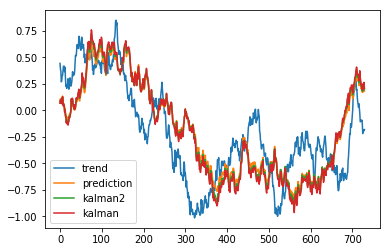

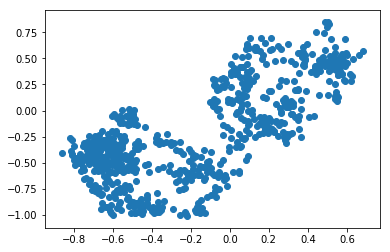

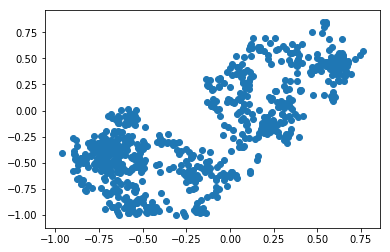

-3.6466152231208993


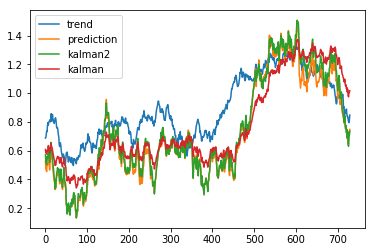

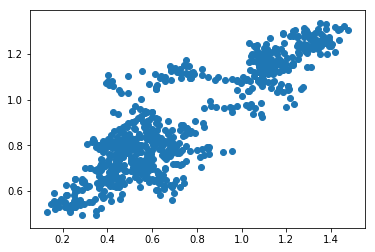

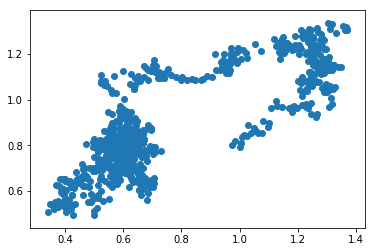

-3.646607369044797


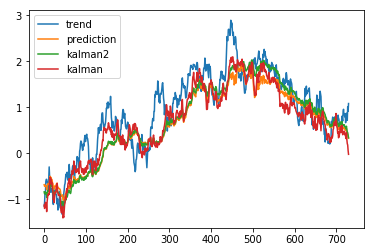

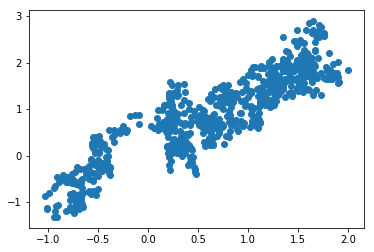

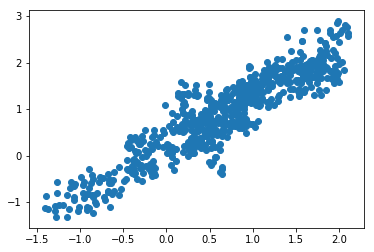

-3.6467001841869218


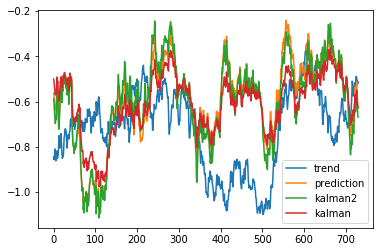

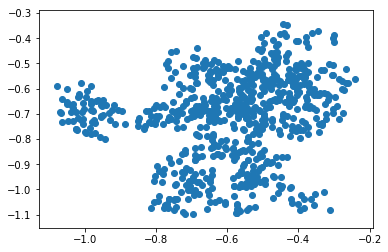

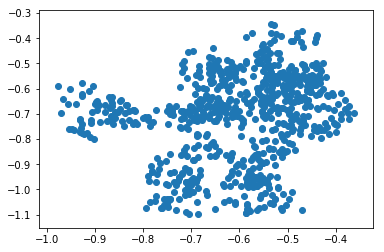

-3.6467058198526514


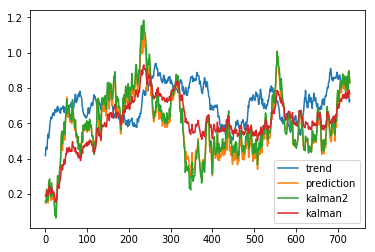

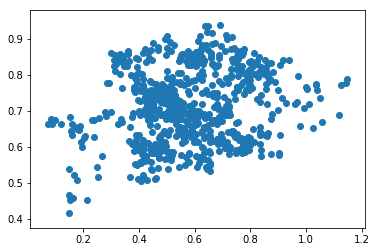

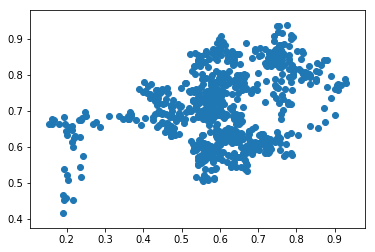

-3.646561270207168


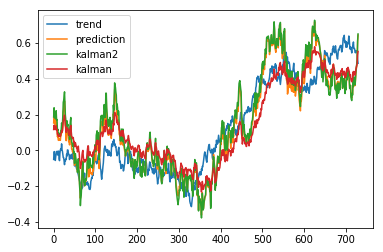

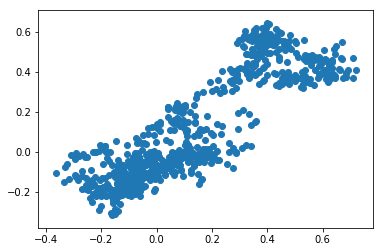

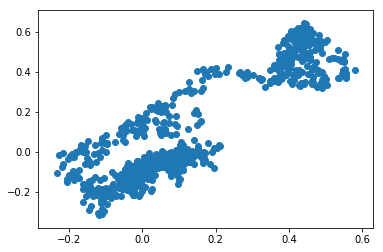

-3.6459850809536887


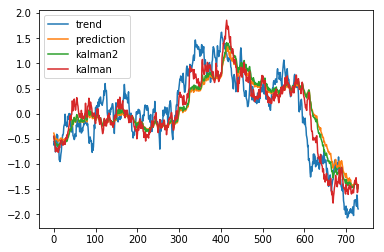

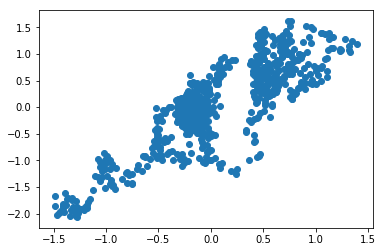

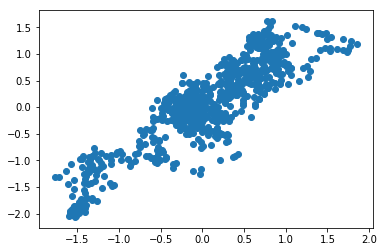

-3.646520463144408


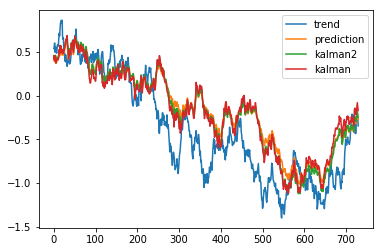

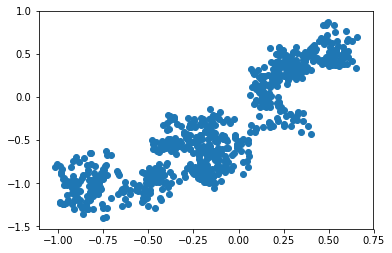

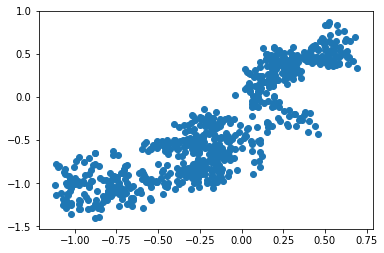

-3.6464189413003636


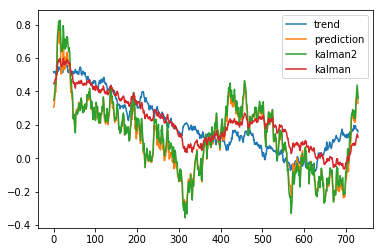

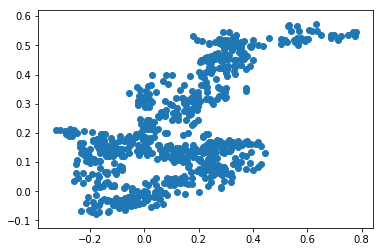

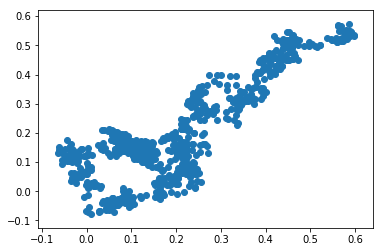

-3.6466187628451747


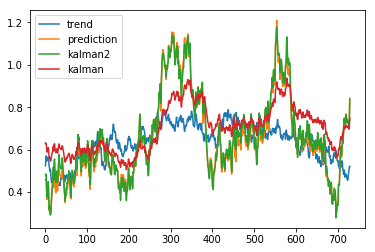

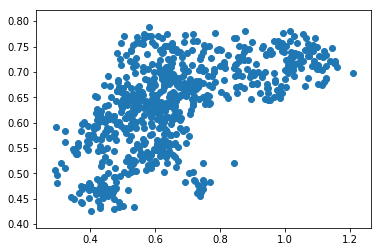

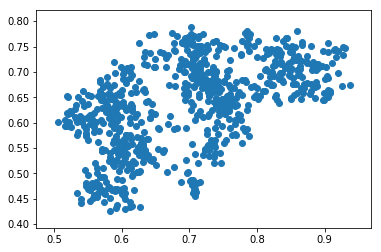

-3.646603811159731


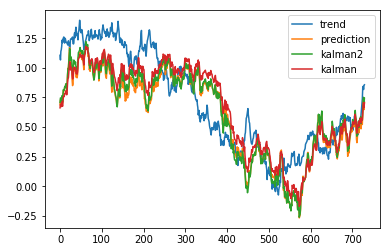

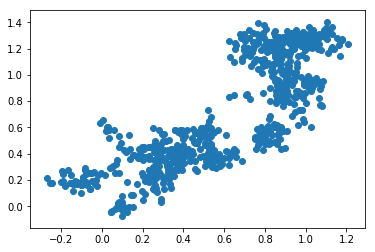

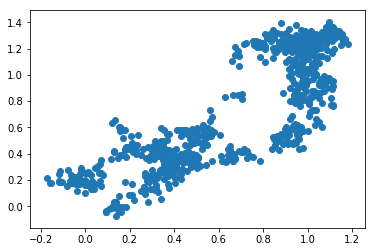

-3.64661429366097


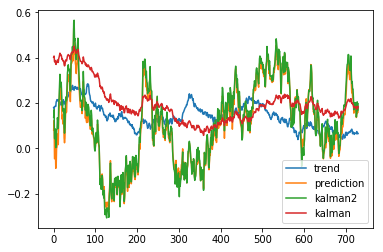

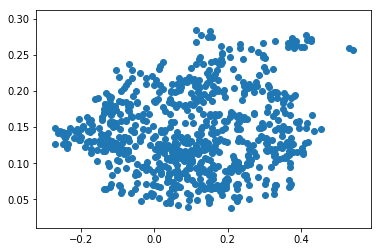

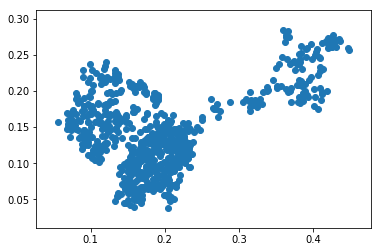

-3.646657342882828


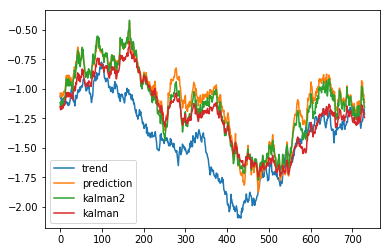

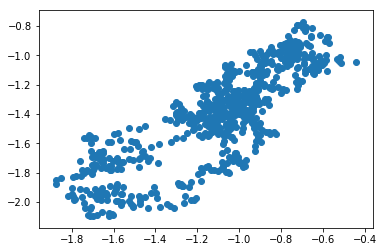

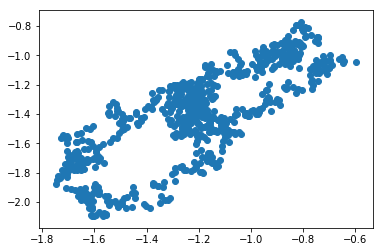

-3.6465959482360644


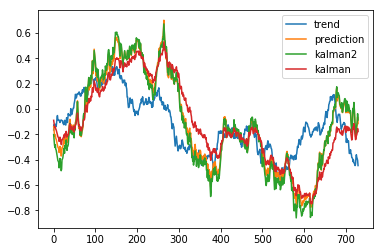

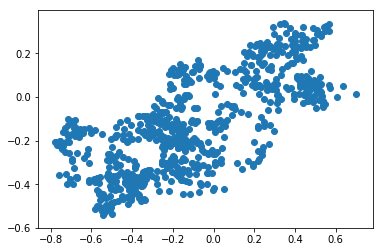

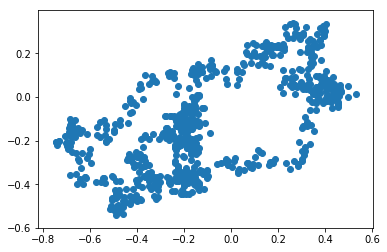

-3.6466004302259547


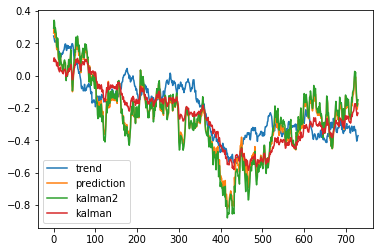

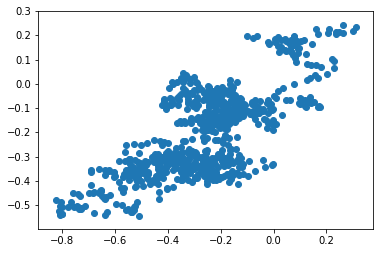

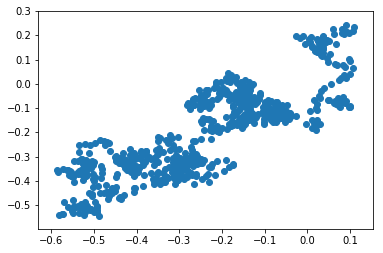

-3.6466063727624727


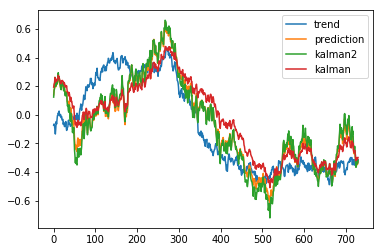

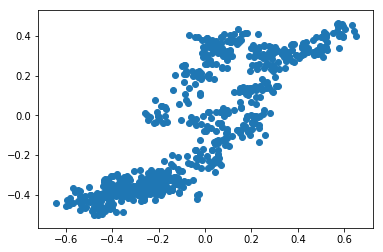

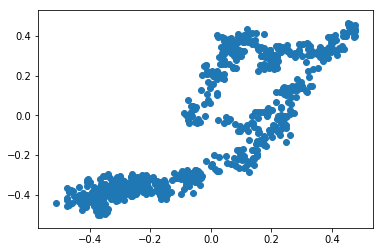

-3.6467149333097053


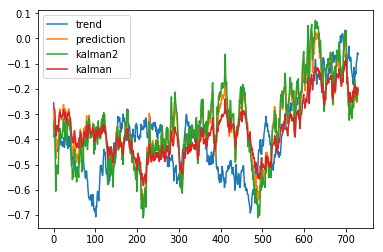

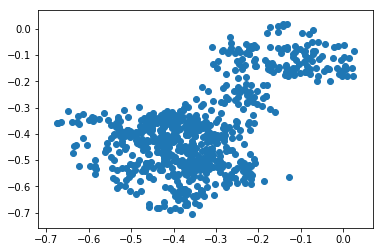

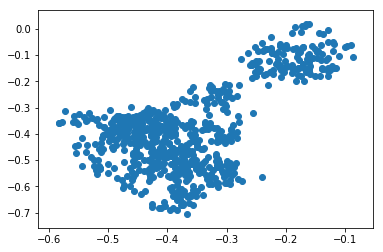

-3.6465610287617904


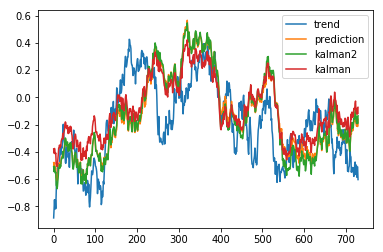

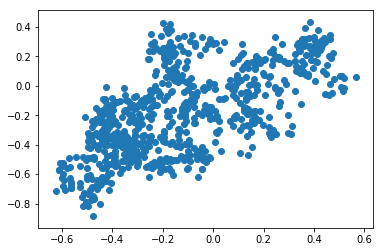

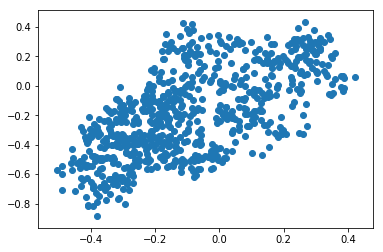

-3.6465819683857275


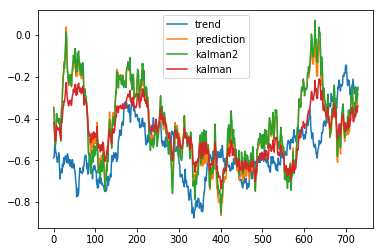

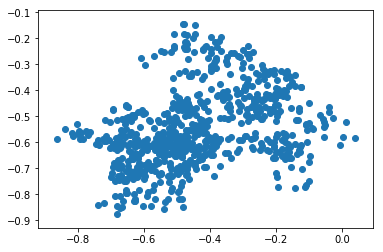

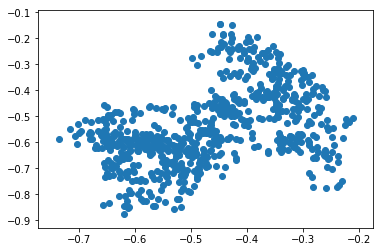

-3.646599157107995


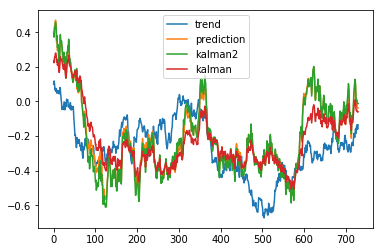

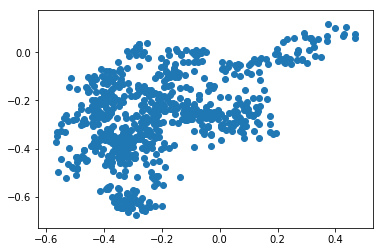

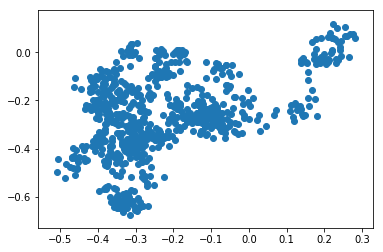

-3.6466270066797746


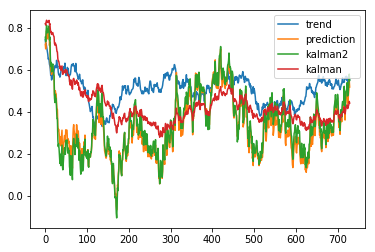

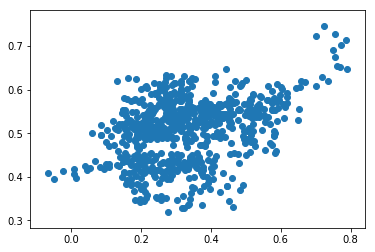

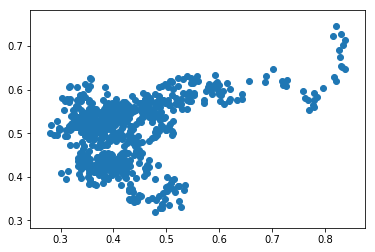

-3.646566999703647


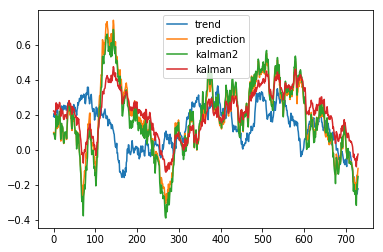

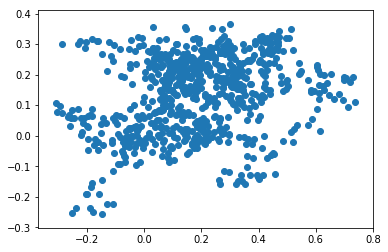

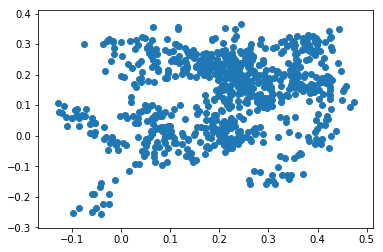

-3.6465798952616764


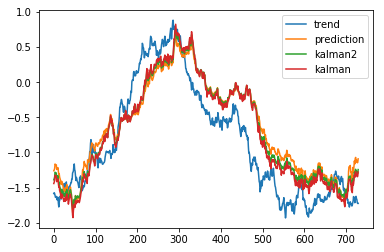

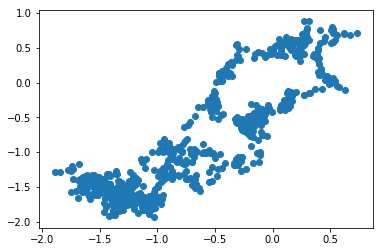

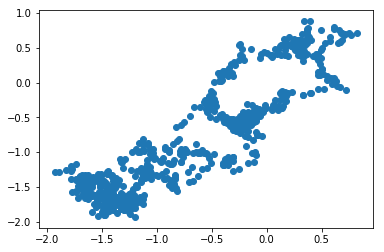

-3.646597974095495


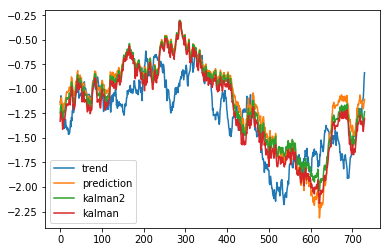

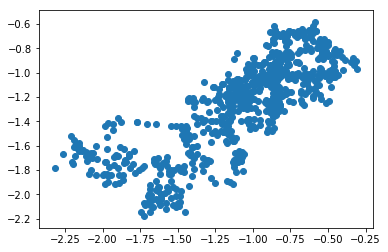

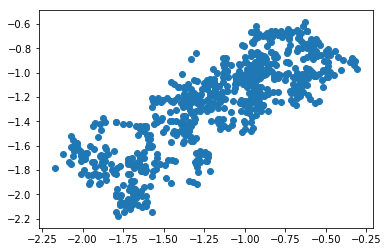

-3.646717562200503


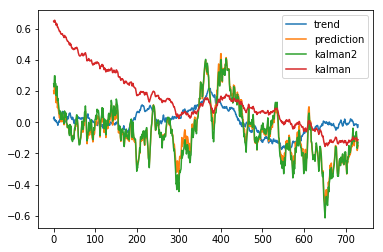

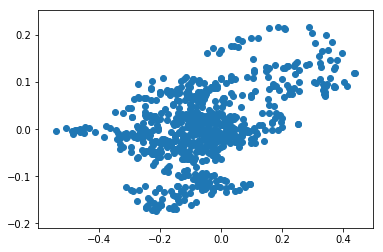

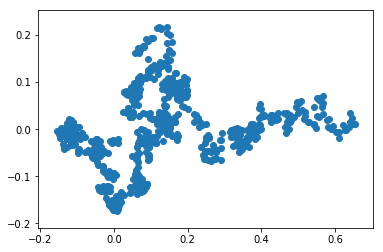

-3.646567384572701


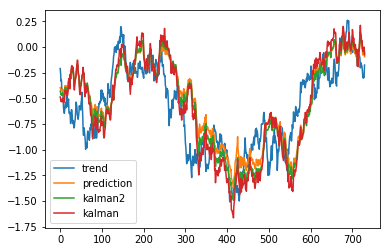

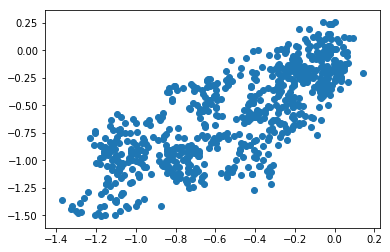

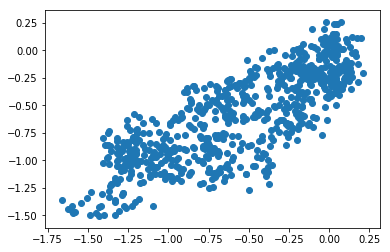

-3.646353415306659


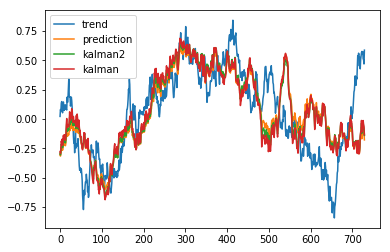

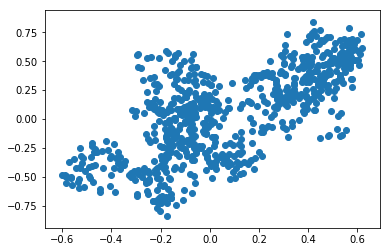

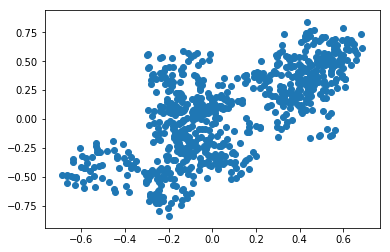

-3.646546604204924


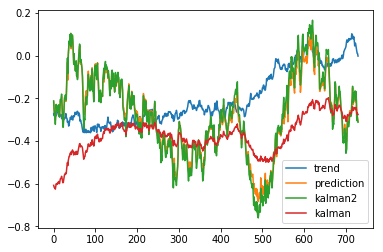

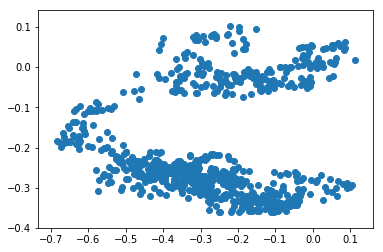

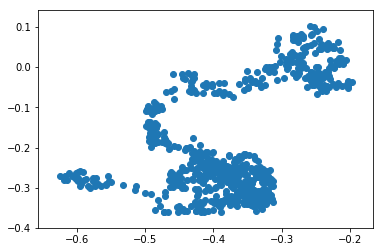

-3.646599191799761


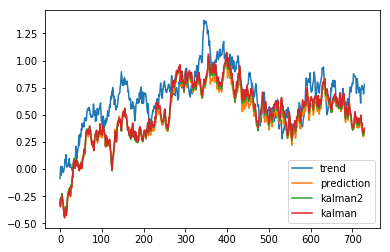

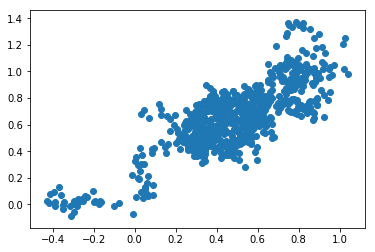

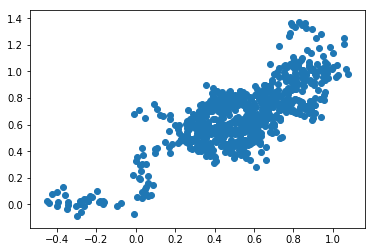

-3.6465892210602773


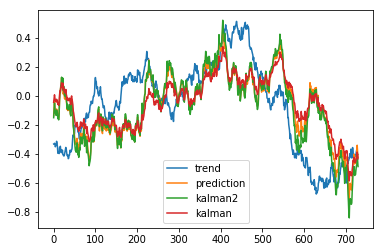

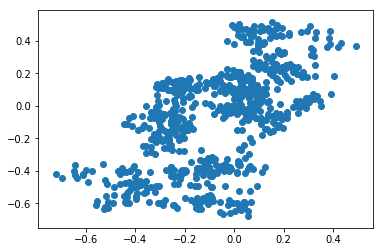

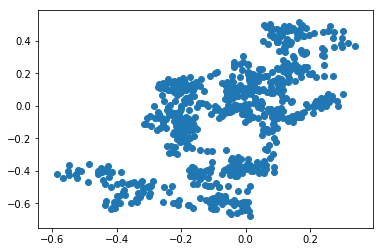

-3.6465609901119036


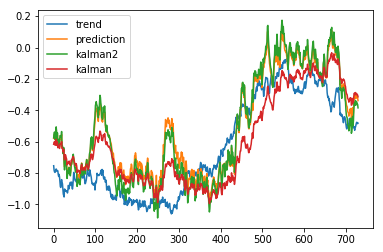

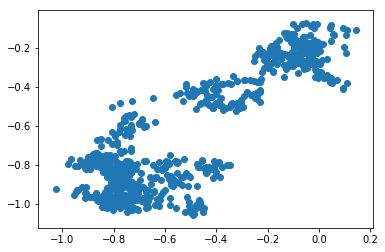

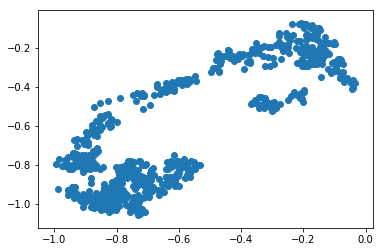

-3.646634929208086


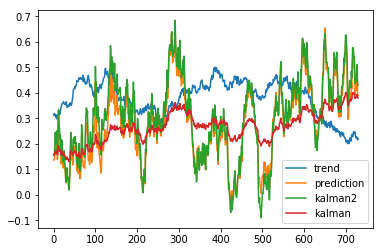

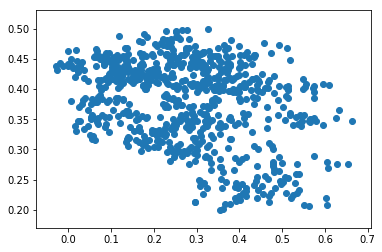

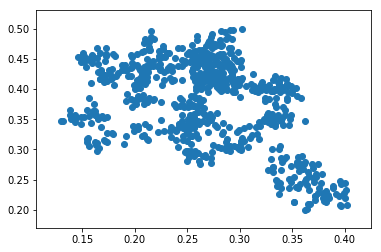

-3.646679271105678


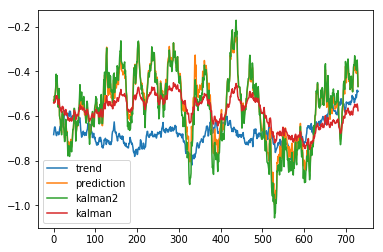

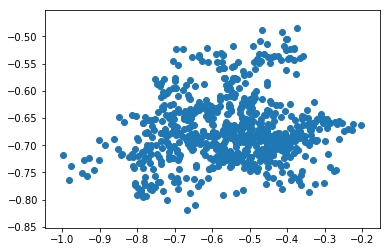

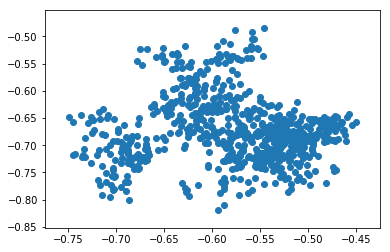

-3.646663578087465


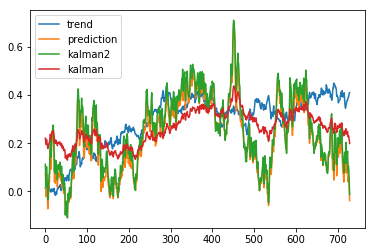

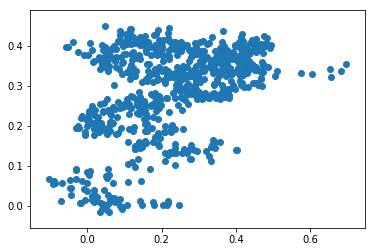

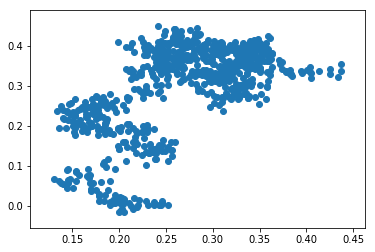

-3.646483889408411


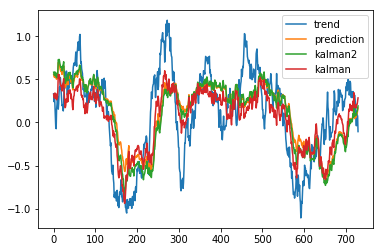

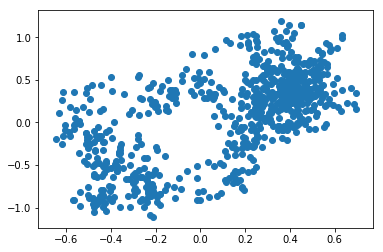

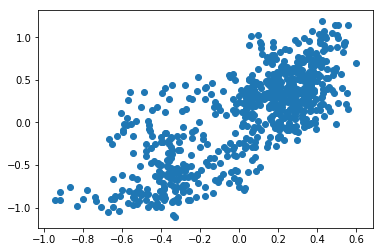

-3.6466897235717637


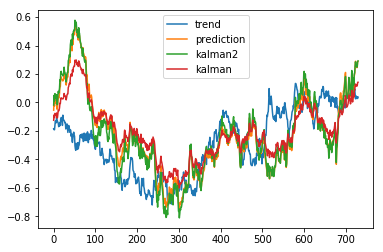

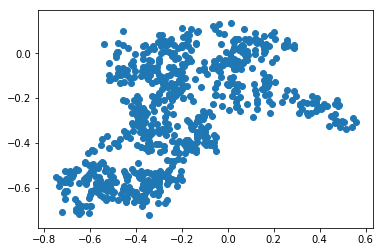

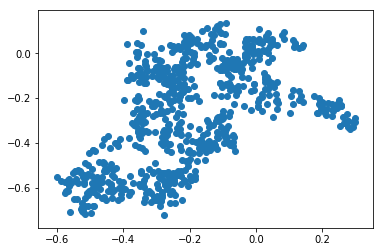

-3.6466697888448847


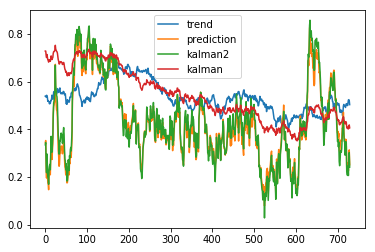

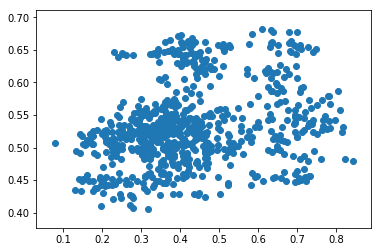

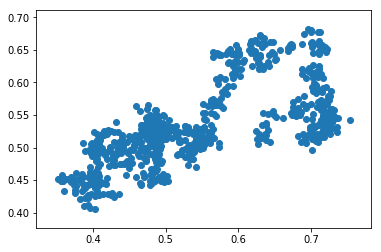

-3.6466497975401593


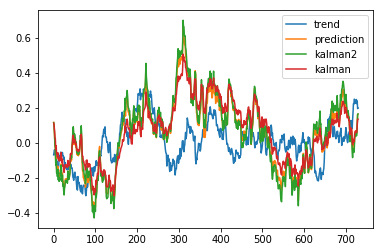

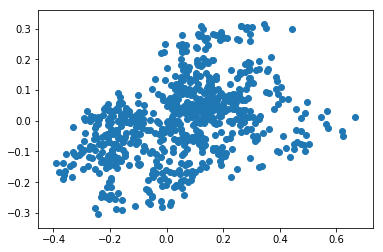

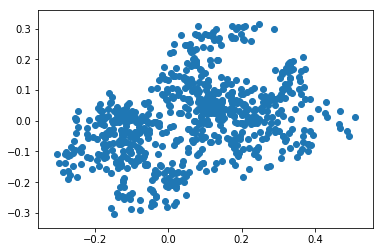

-3.6464378855656845


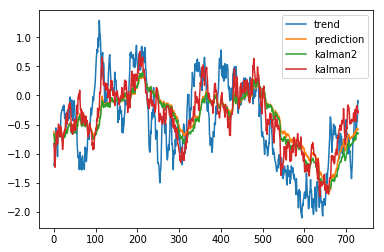

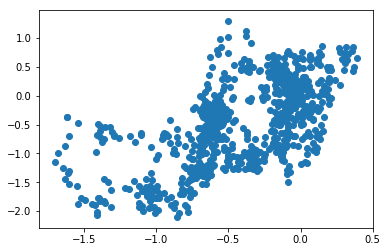

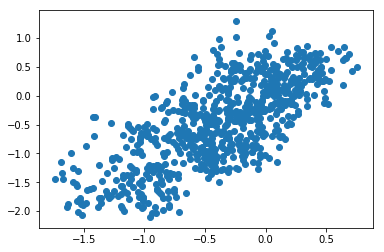

-3.64669091962278


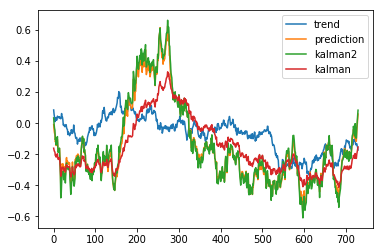

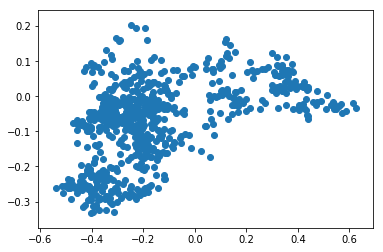

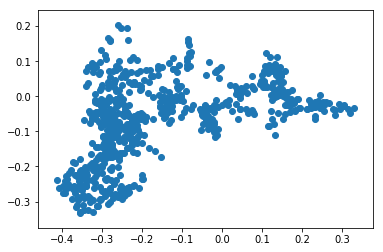

-3.646562056941913


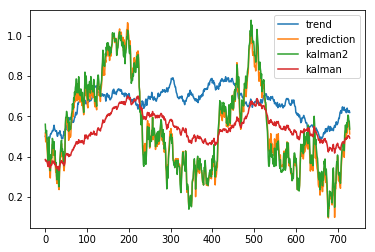

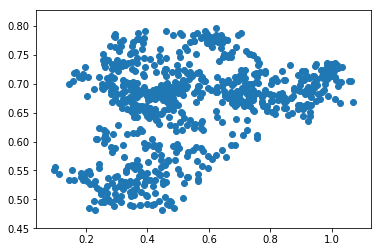

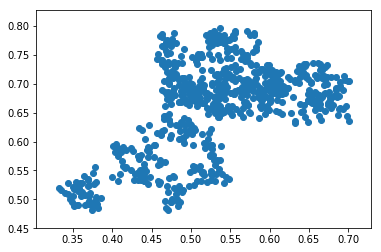

-3.6465772524010402


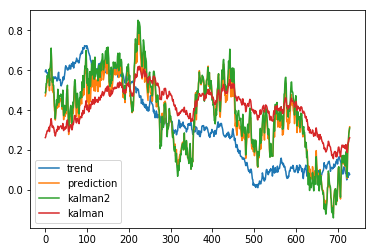

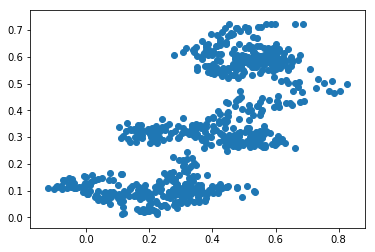

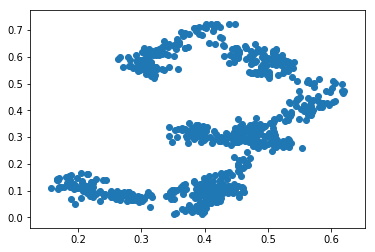

-3.6465744942892355


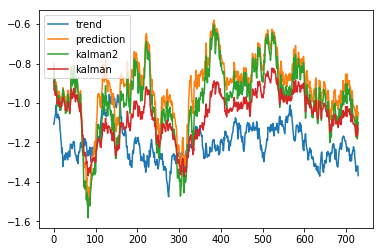

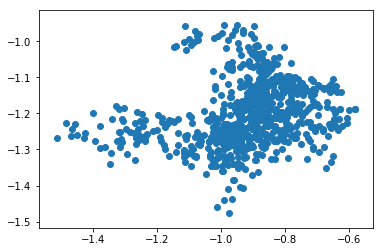

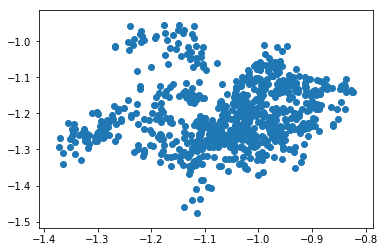

-3.6466728414874536


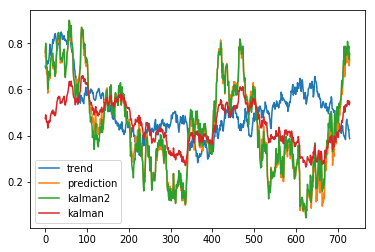

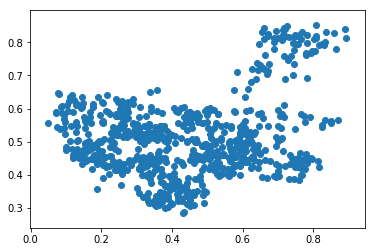

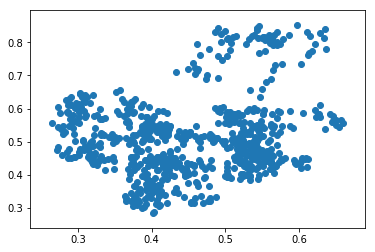

-3.6467251790221793


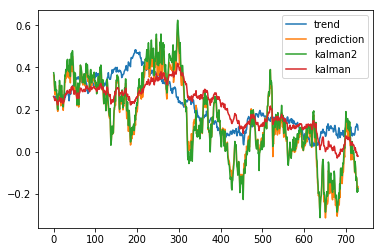

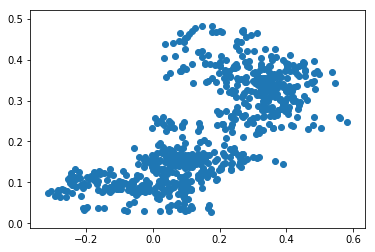

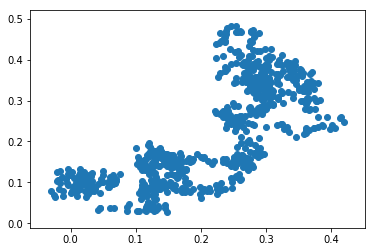

-3.6466077115386737


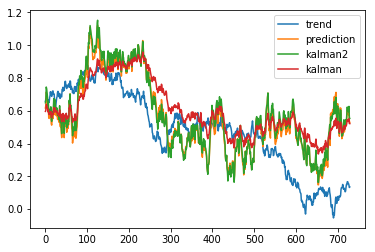

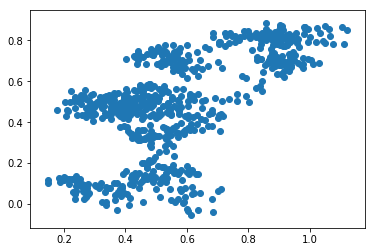

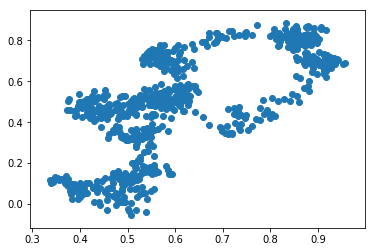

-3.646590322116391


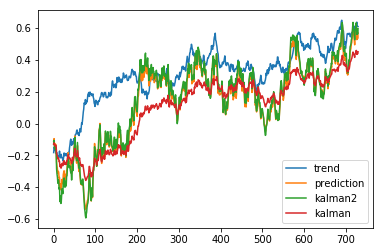

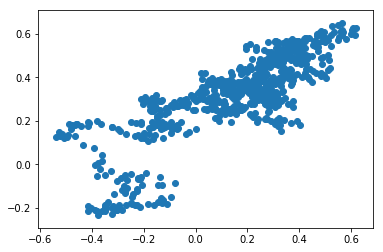

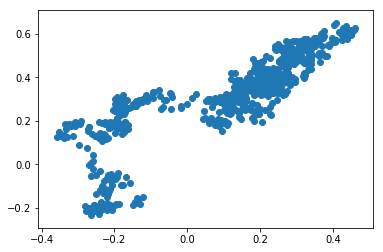

-3.646620683697985


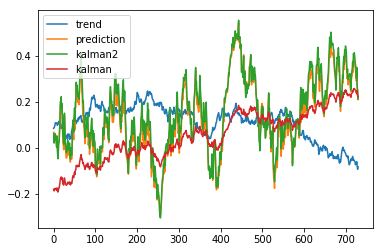

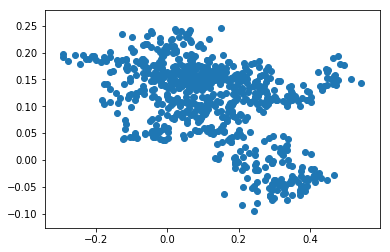

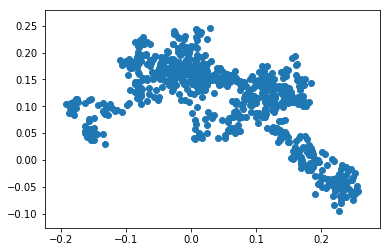

-3.646647137217225


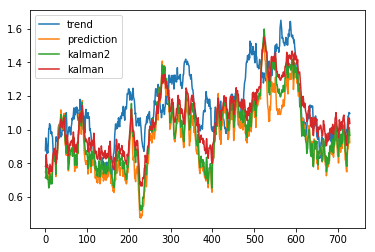

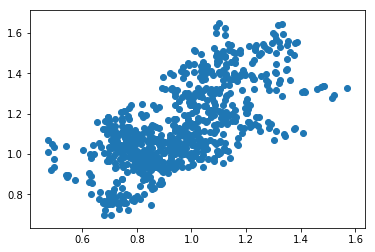

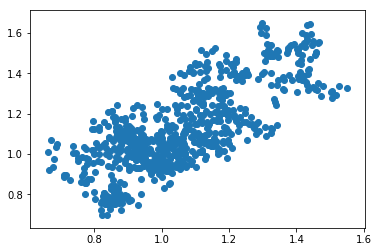

-3.6466157115995896


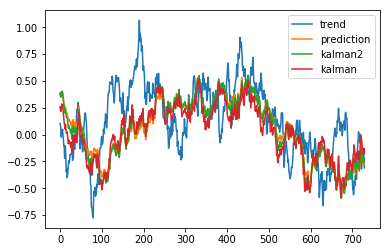

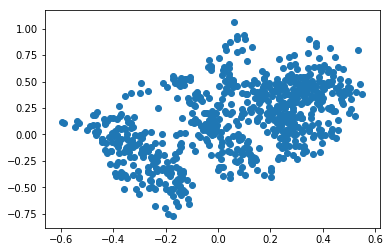

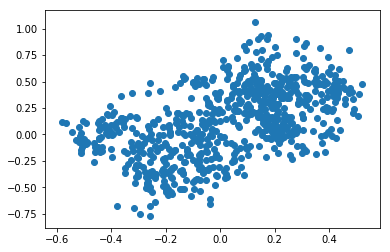

-3.6465753504075122


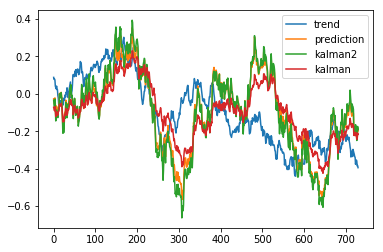

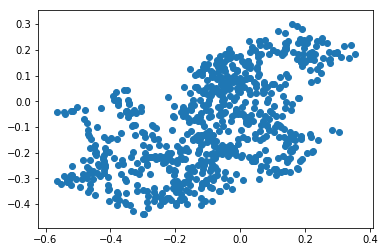

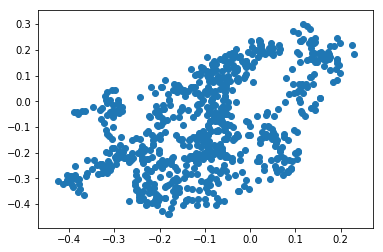

-3.646583921601997


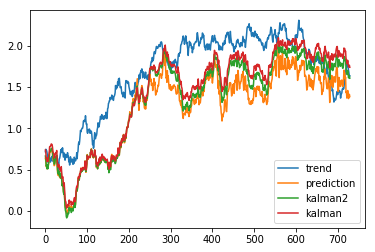

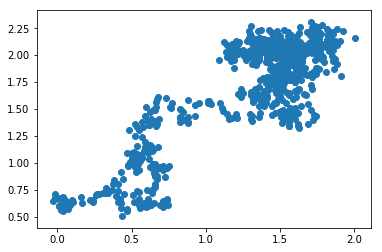

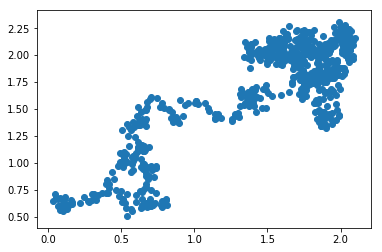

-3.6465703145135206


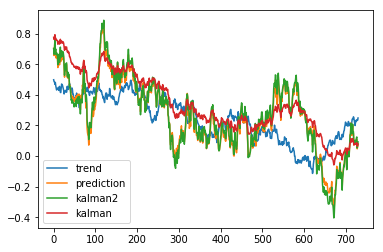

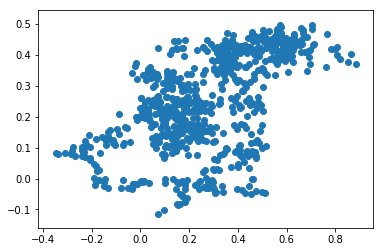

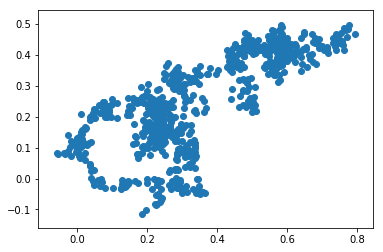

-3.646661176905037


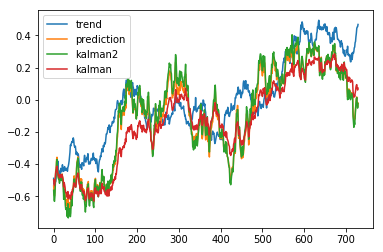

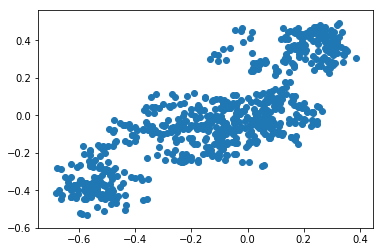

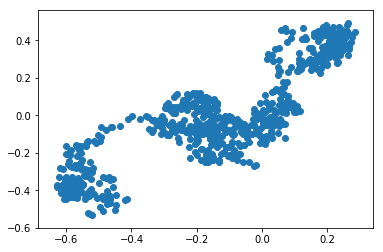

-3.6466602085623903


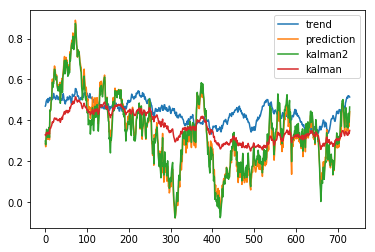

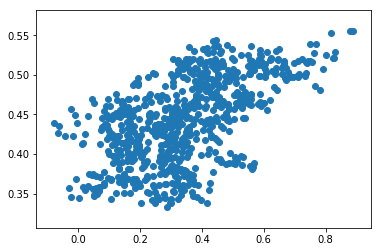

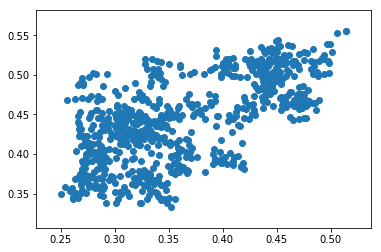

-3.6468170335050685


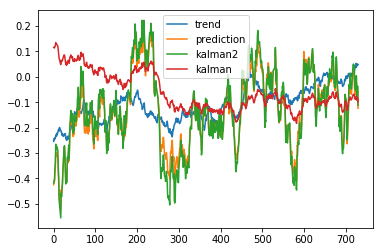

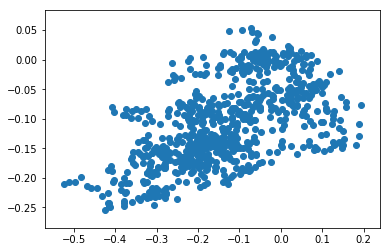

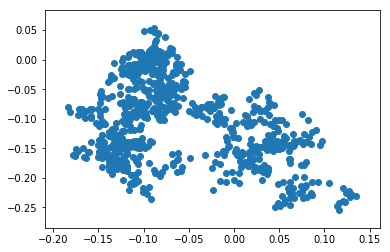

-3.646608916902916


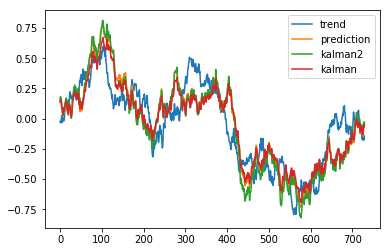

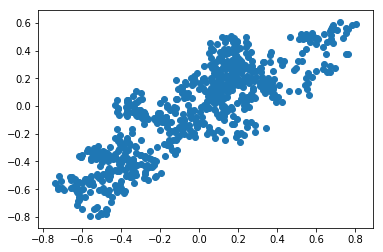

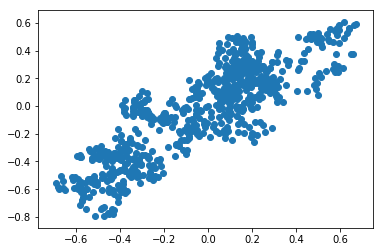

-3.6467690843623144


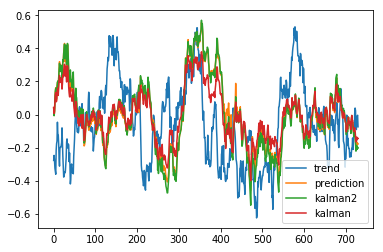

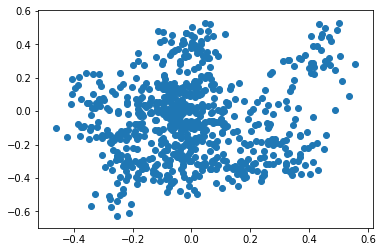

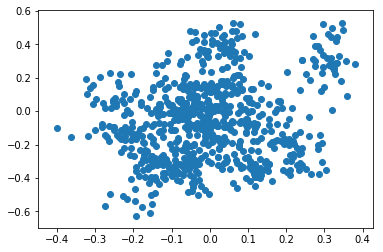

-3.6462238834705216


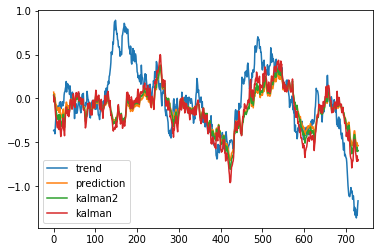

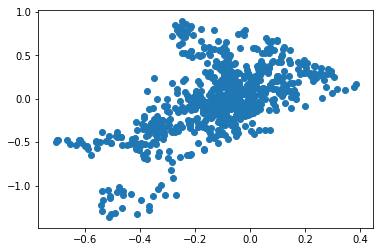

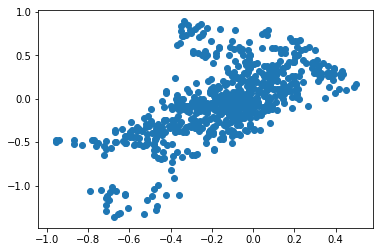

-3.6468279718887073


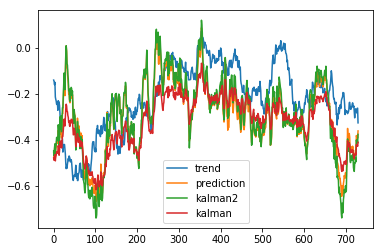

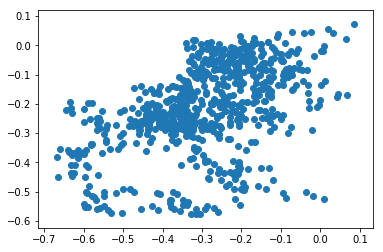

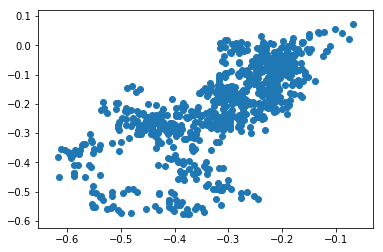

-3.6466982123442007


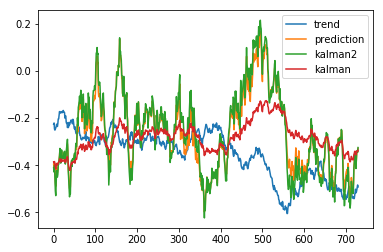

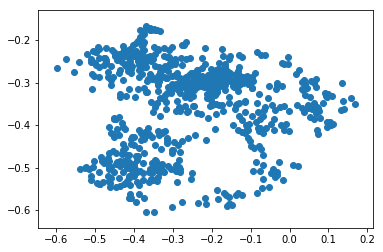

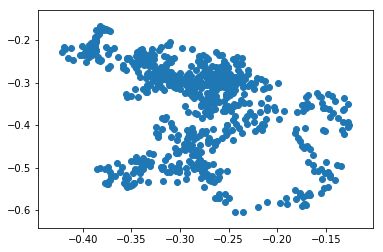

-3.646532683959232


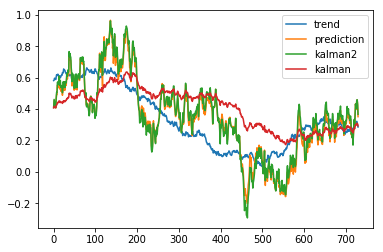

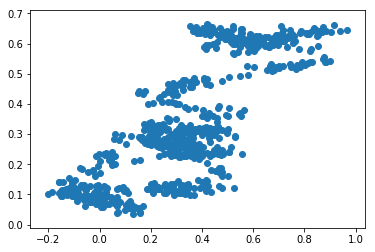

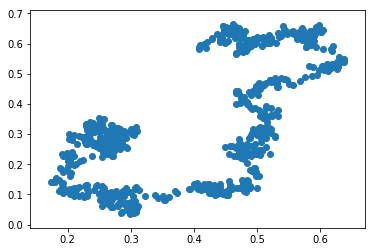

-3.6466046558693064


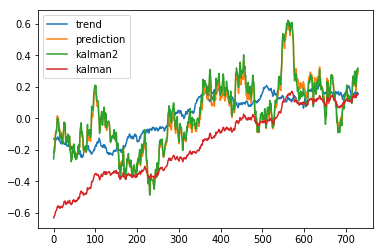

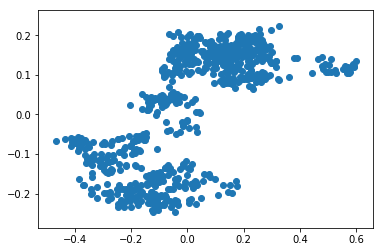

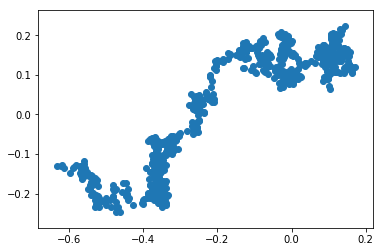

-3.6464916466269655


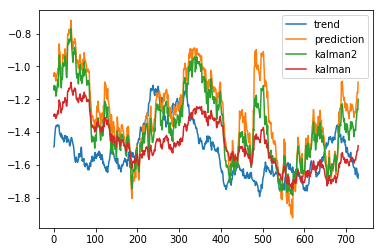

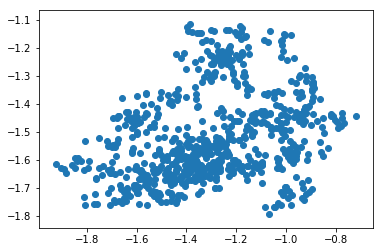

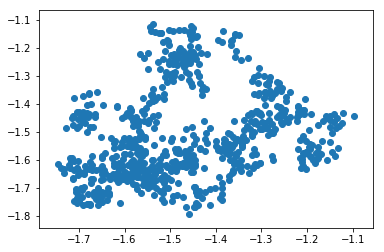

-3.6465334304142756


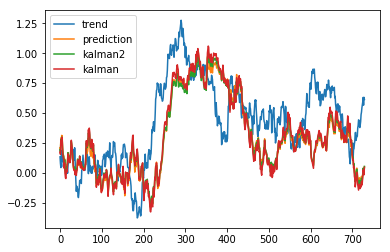

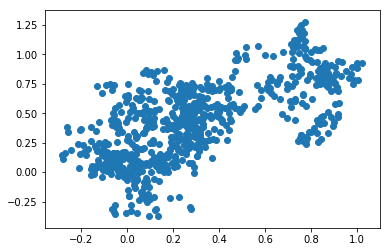

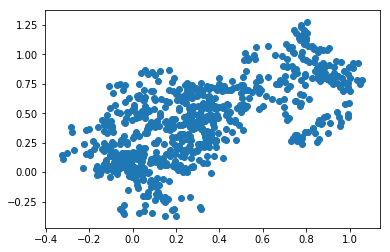

-3.6464229094330234


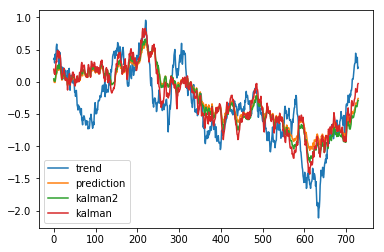

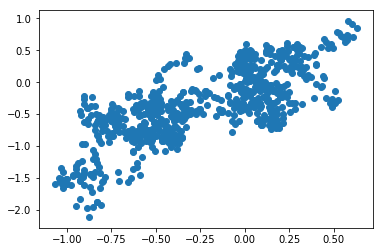

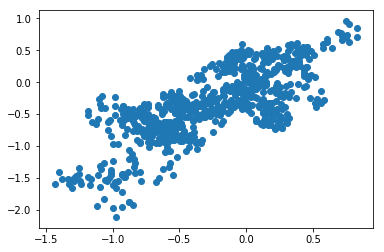

-3.6465071708429617


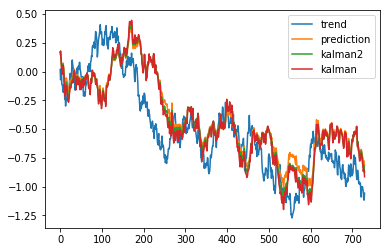

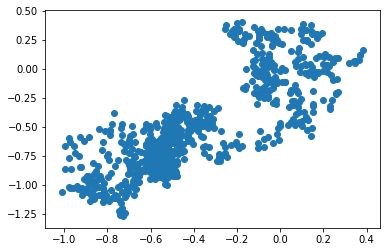

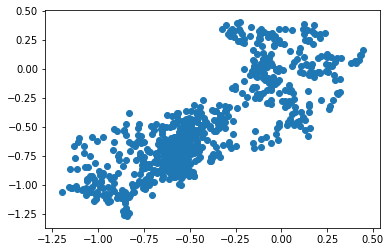

-3.6466015971731407


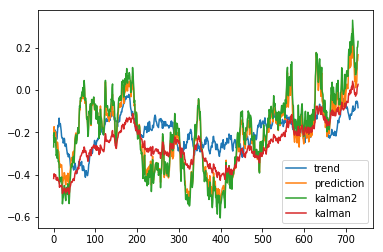

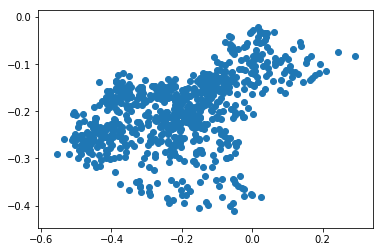

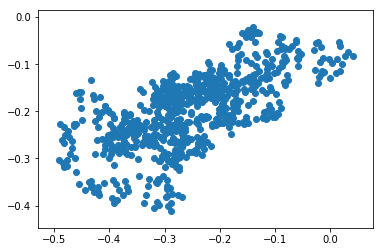

-3.6466544911731047


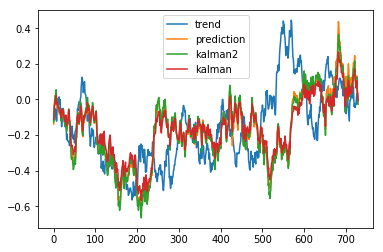

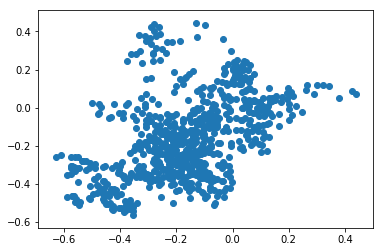

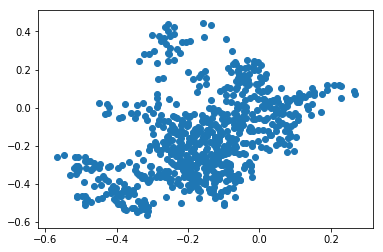

-3.646565860928969


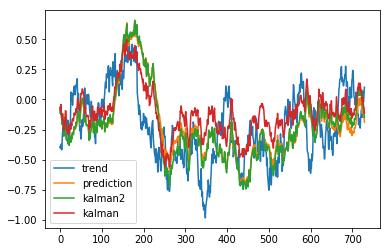

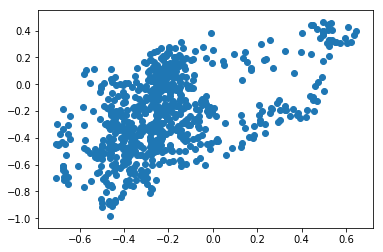

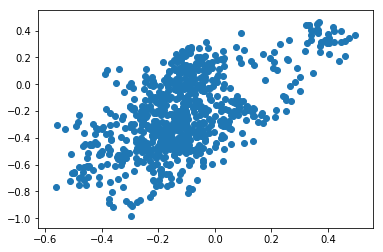

-3.646670975117014


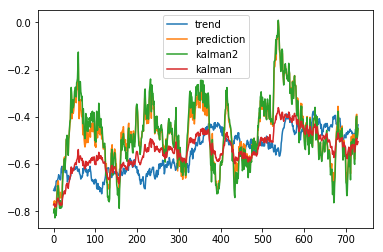

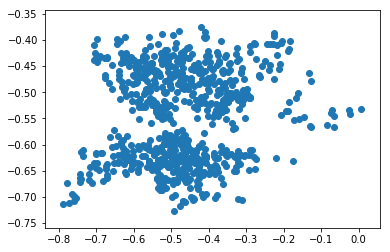

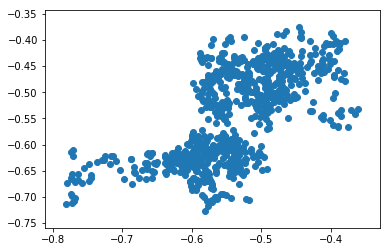

-3.6466261633671833


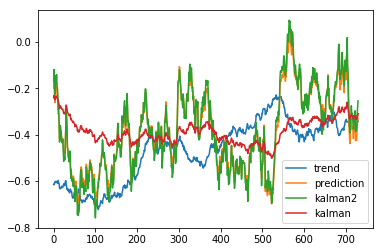

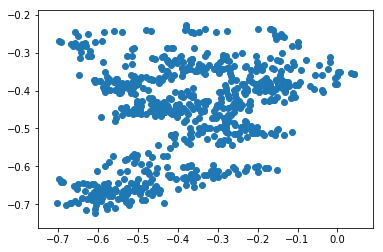

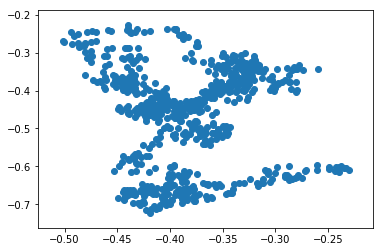

-3.646562524000184


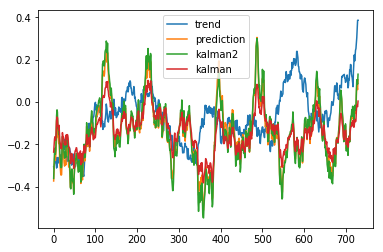

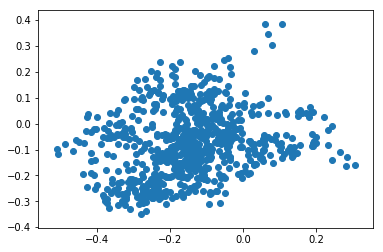

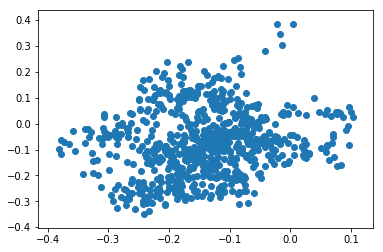

-3.6465609116479767


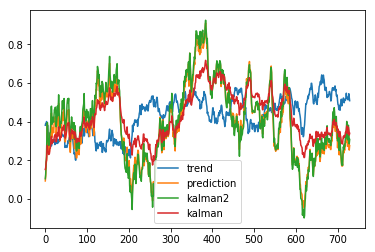

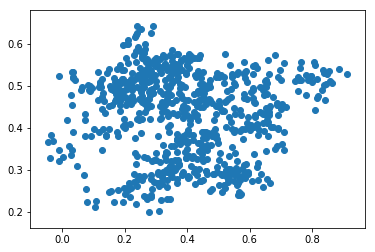

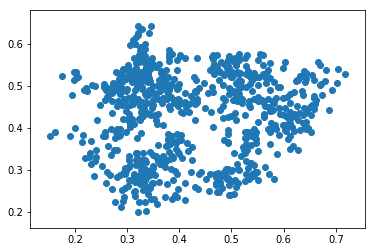

-3.646493967715652


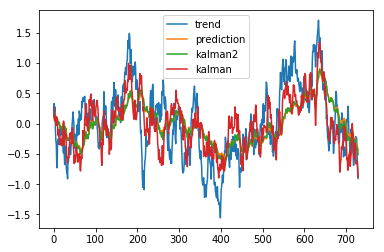

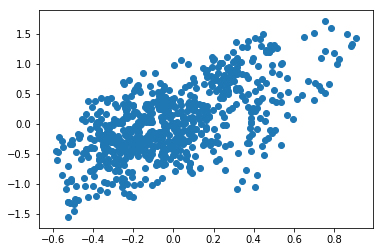

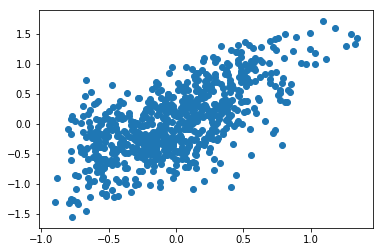

-3.6465610909275723


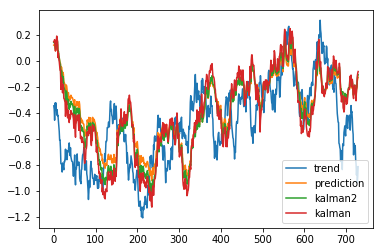

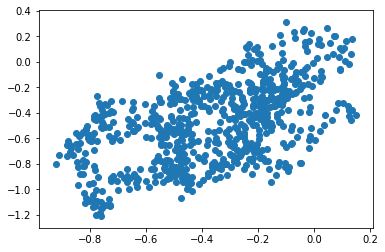

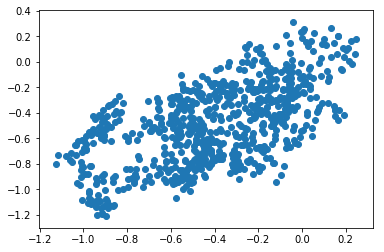

-3.646595534961672


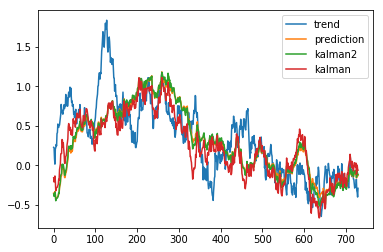

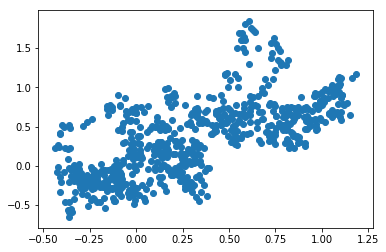

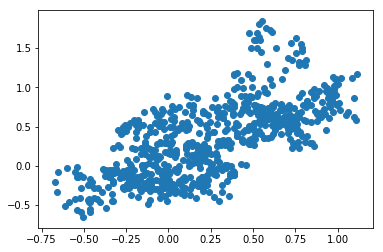

-3.6466979927849037


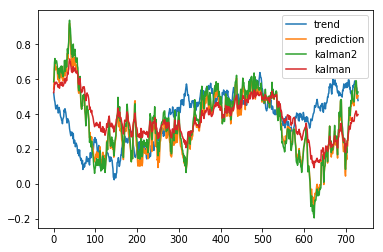

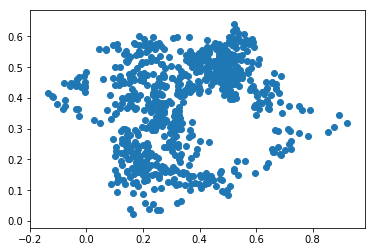

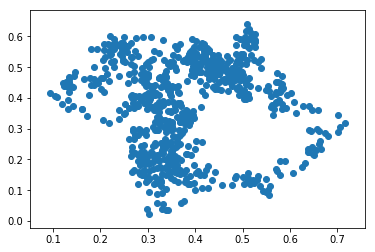

-3.6465419976506395


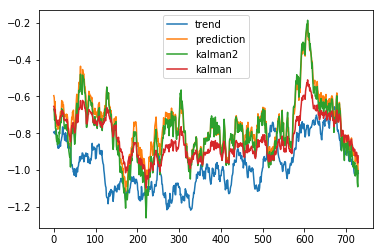

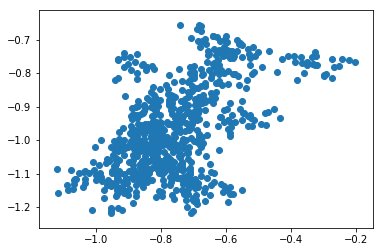

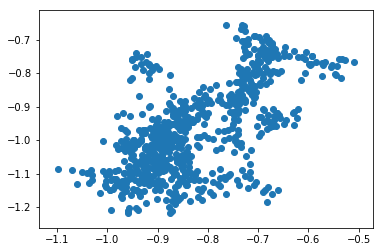

-3.6464505520183605


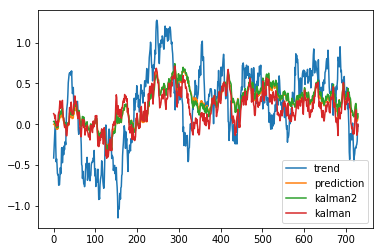

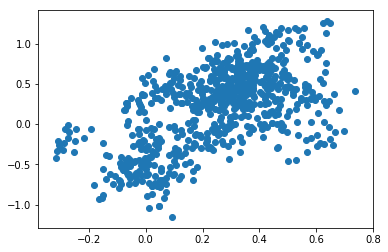

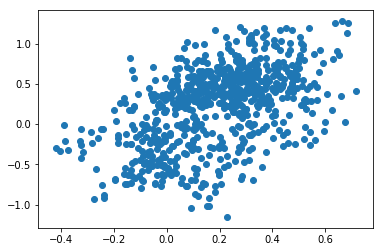

-3.646608831919731


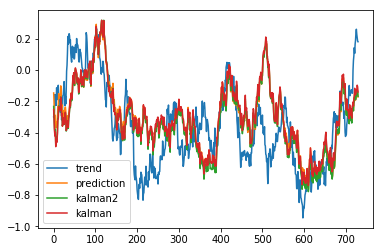

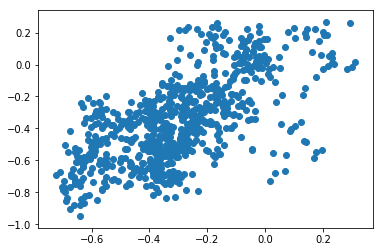

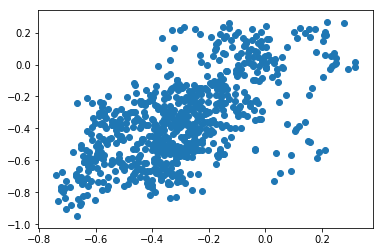

-3.6466496923007083


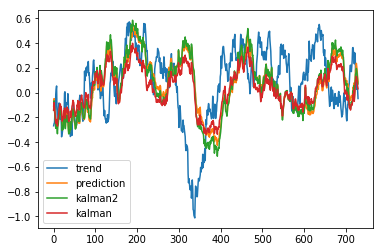

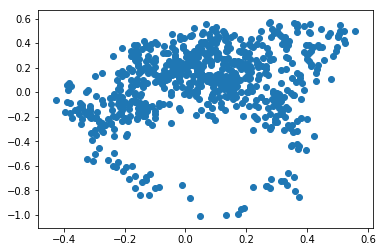

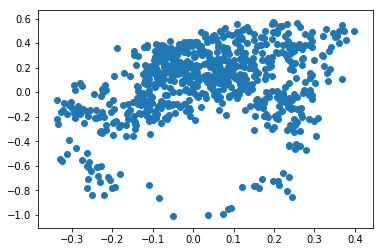

-3.6465435368940247


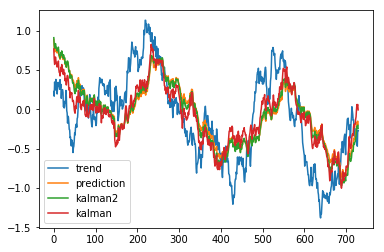

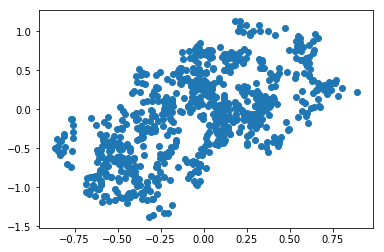

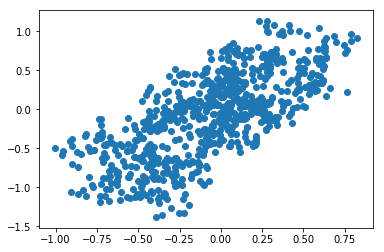

-3.6465852922759963


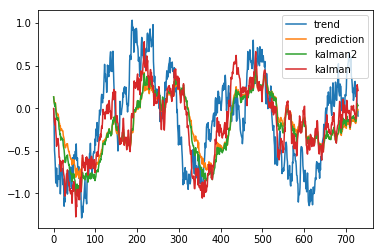

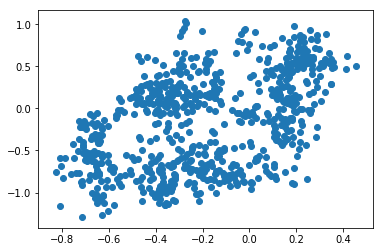

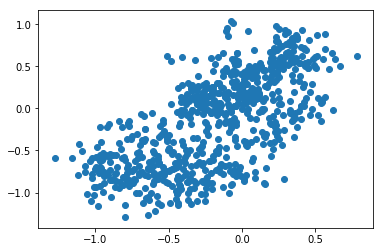

-3.646601725695656


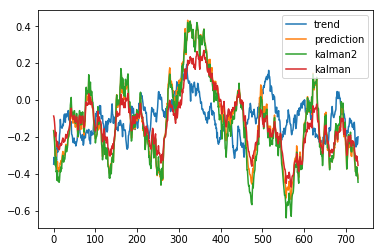

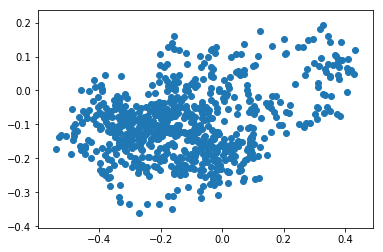

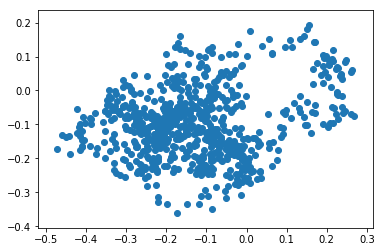

-3.646565332869069


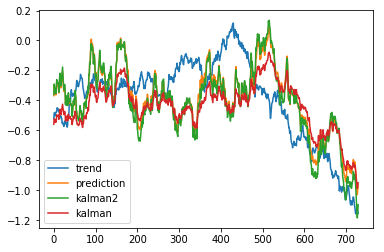

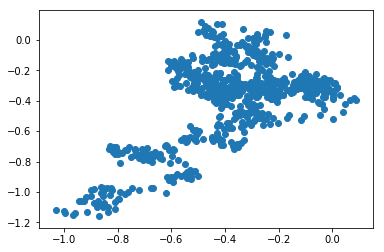

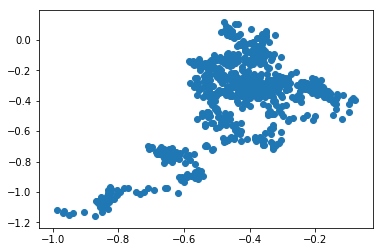

-3.6465774209704263


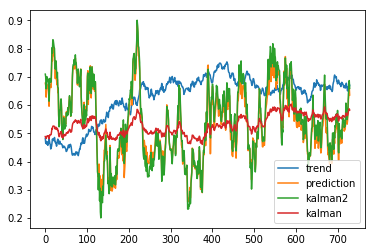

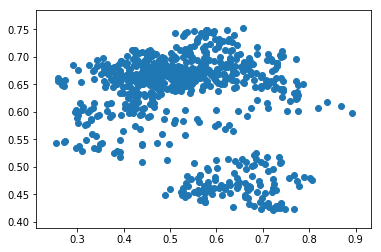

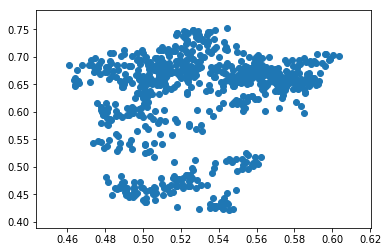

-3.6463157088495803


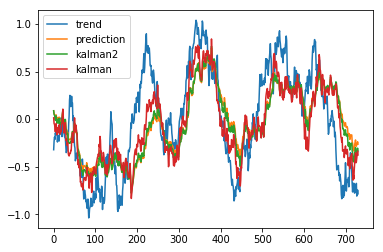

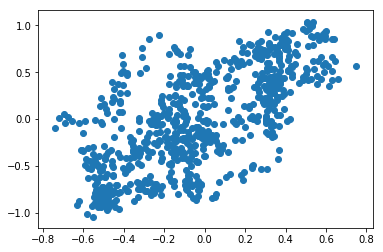

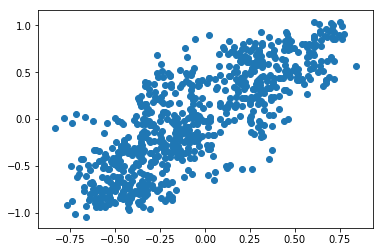

-3.64655215162784


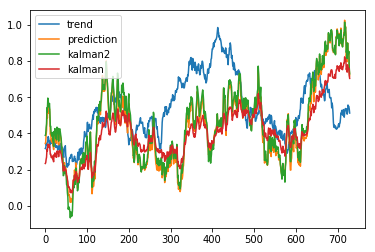

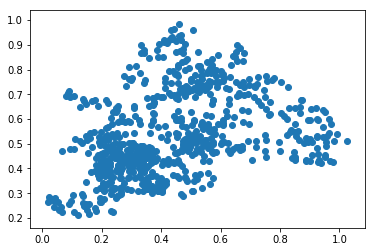

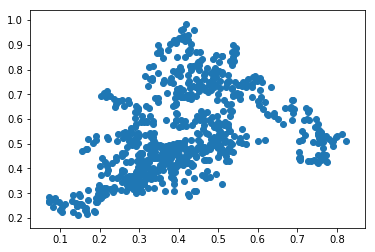

-3.6465309137478483


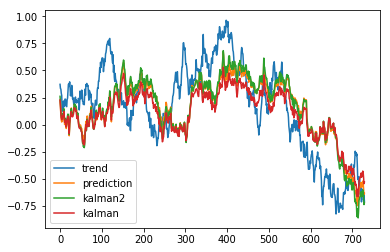

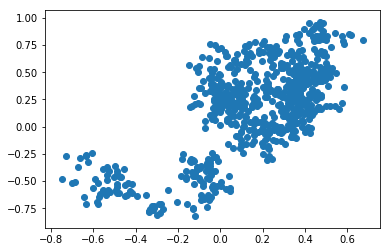

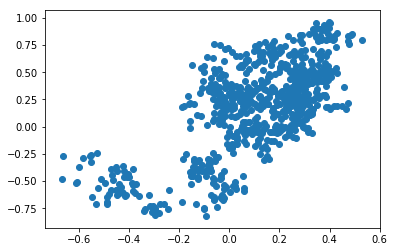

-3.6466973785776657


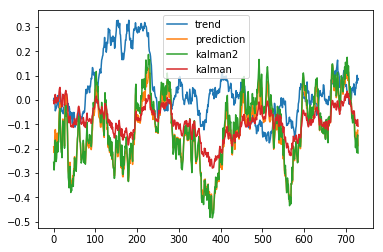

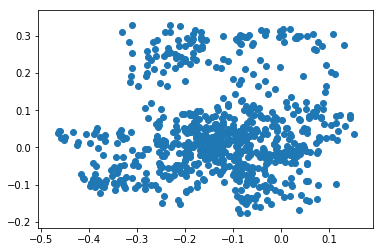

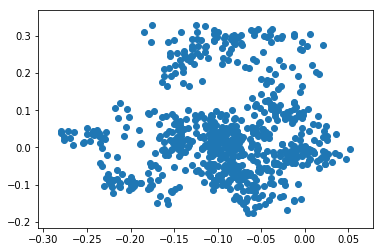

-3.646641368372367


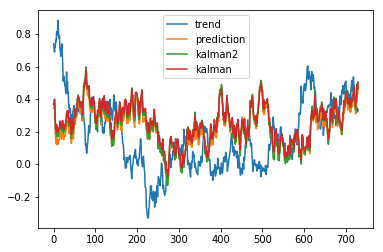

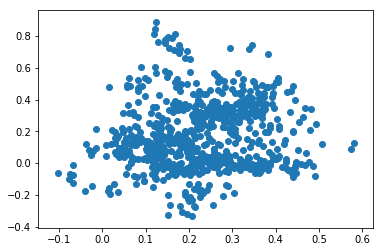

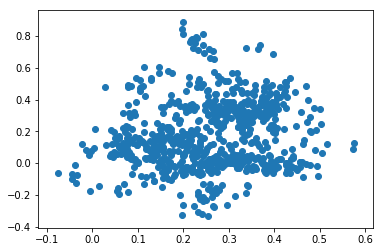

-3.646616150951014


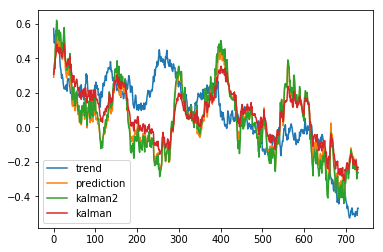

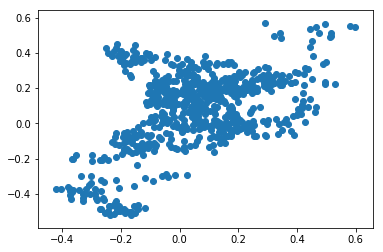

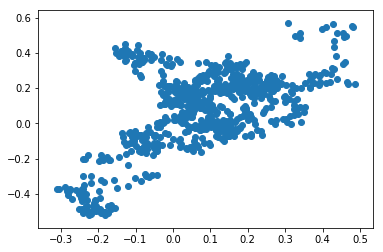

-3.646569914976136


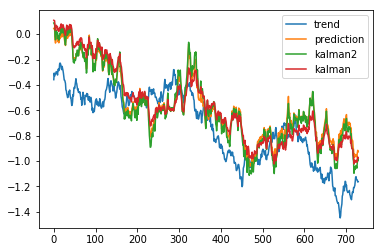

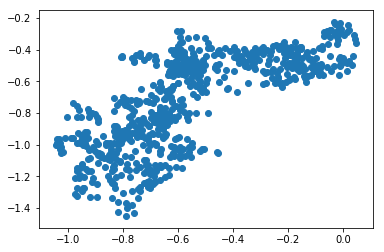

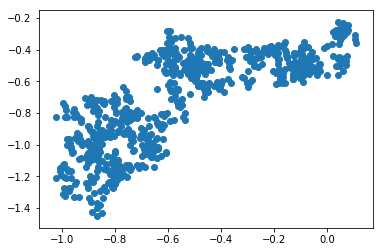

-3.646655366616325


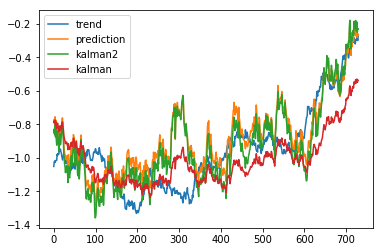

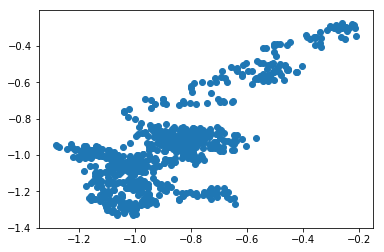

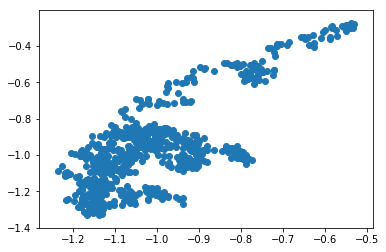

-3.646346005238594


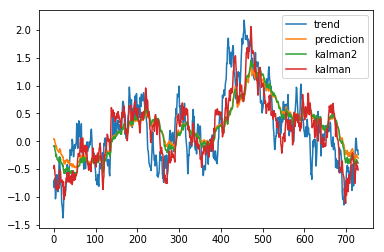

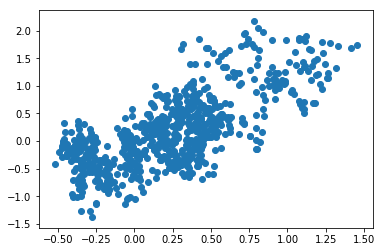

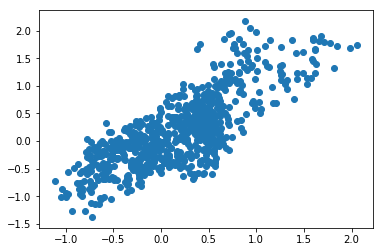

-3.646618564706297


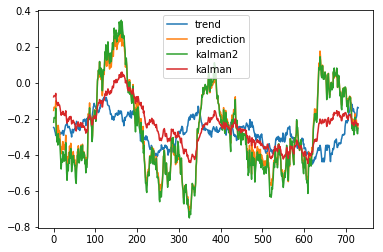

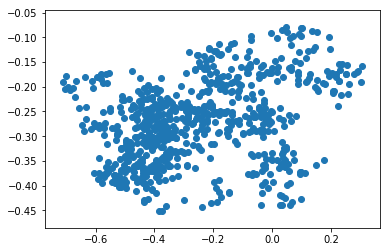

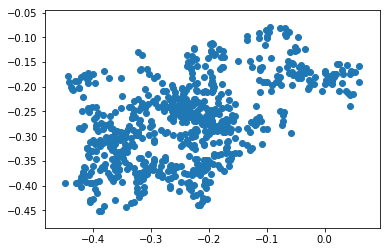

-3.6466007857583476


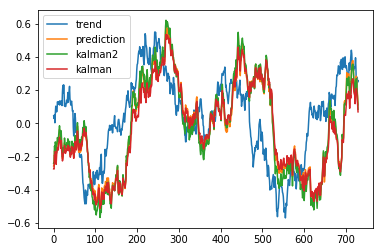

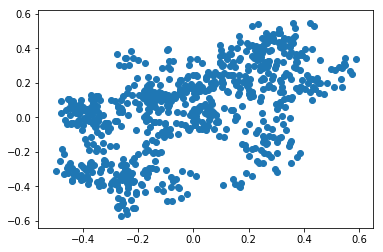

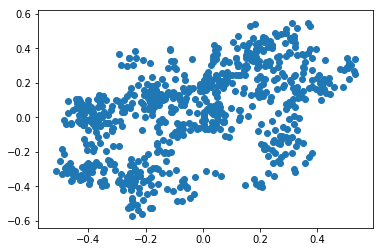

-3.646670013992117


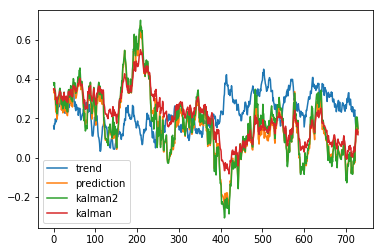

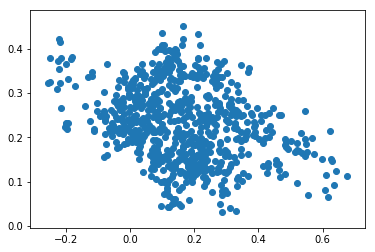

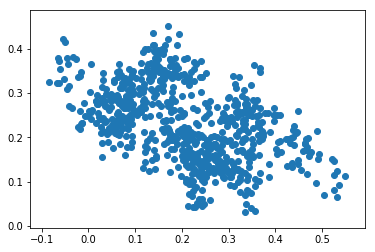

-3.6464577418286366


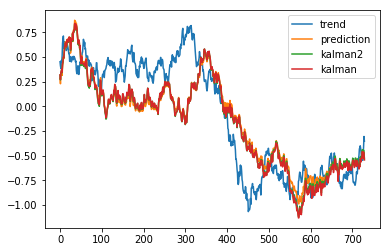

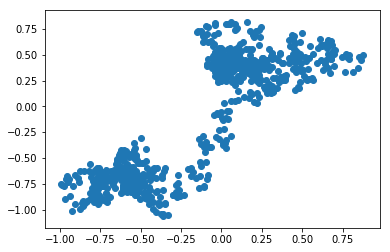

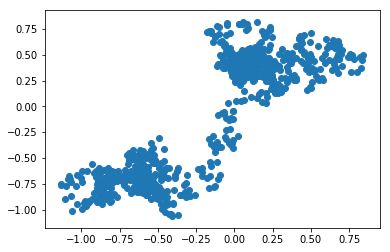

-3.646655758004637


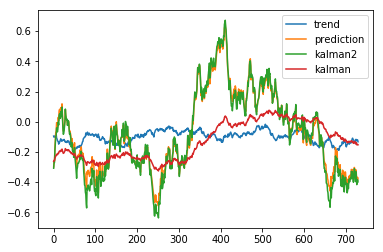

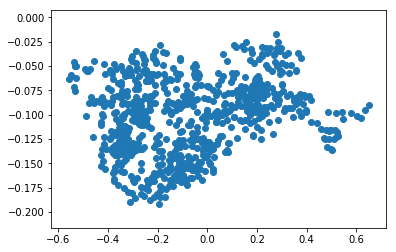

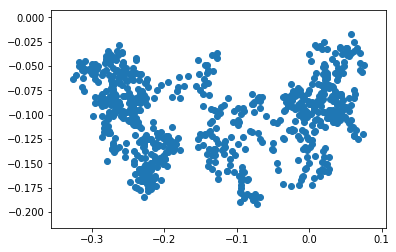

In [11]:
writer = tf.summary.FileWriter(logs_dir, graph)
lrate = 0.001
with tf.Session(graph=graph) as sess:
    sess.run(tf.global_variables_initializer())
    for i in range(3000):
        X,Y ,trends, dicti= next(generator)
        state = sess.run( initial_state)
        variables =tf.trainable_variables()
        if i==1500:
            lrate /= 3.
        
        if i==2250:
            lrate /= 3.
        feed = { inputs_: X,
                initial_state :state,
               targets_: Y ,
               learning_rate: lrate,
               grad_clip: 0.1}
        if (i+1) %100 == 0 :
            result = sess.run( [cost, outputs], feed_dict=feed)
            print( result[0]-noise**2)
            plt.plot( trends[1:,0][start:], label='trend')
            plt.plot( result[1][0,:,0][start:] , label='prediction')

            index=0
            lbd = 1
            sigma = 0.9
            sigmaS= 0.1
            deltaT= 1./365
            kalman_result =  kalman.kalman_estimate( X[index, :,0] ,
                                             sigmaS =sigmaS ,
                                             lbd=lbd,
                                             sigmamu= sigma,
                                             deltaT=deltaT )
            plt.plot(kalman_result[start:], label='kalman2' )

            kalman_result =  kalman.kalman_estimate( X[0, :,0] ,
                                                    sigmaS =noise/np.sqrt(365.) ,
                                                    lbd=dicti['lbd'],
                                                    sigmamu= dicti['sigma'],
                                                    deltaT=dicti['deltaT'] )
            plt.plot(kalman_result[start:], label='kalman' )
            plt.legend( loc='best')
            plt.show()
            plt.scatter( result[1][0,start:,0], trends[1:,0][start:])
            plt.show()
            plt.scatter( kalman_result[start:], trends[1:,0][start:])
            plt.show()
        sess.run( [optimizer], feed_dict=feed)
        ## print result
    for i in range(100):
        X,Y ,trends, dicti= next(generator)
        state = sess.run( initial_state)
        feed = { inputs_: X,
                initial_state :state,
               targets_: Y ,
               learning_rate: 0.001,
               grad_clip: 0.1}
        if i> -1 :
            result = sess.run( [cost, outputs], feed_dict=feed)
            print( result[0]-noise**2)
            plt.plot( trends[1:,0][start:], label='trend')
            plt.plot( result[1][0,:,0][start:] , label='prediction')

            index=0
            lbd = 1
            sigma = 0.9
            sigmaS= 0.1
            deltaT= 1./365
            kalman_result =  kalman.kalman_estimate( X[index, :,0] ,
                                             sigmaS =sigmaS ,
                                             lbd=lbd,
                                             sigmamu= sigma,
                                             deltaT=deltaT )
            plt.plot(kalman_result[start:], label='kalman2' )

            kalman_result =  kalman.kalman_estimate( X[0, :,0] ,
                                                    sigmaS =noise/np.sqrt(365.) ,
                                                    lbd=dicti['lbd'],
                                                    sigmamu= dicti['sigma'],
                                                    deltaT=dicti['deltaT'] )
            plt.plot(kalman_result[start:], label='kalman' )
            plt.legend( loc='best')
            plt.show()
            plt.scatter( result[1][0,start:,0], trends[1:,0][start:])
            plt.show()
            plt.scatter( kalman_result[start:], trends[1:,0][start:])
            plt.show()
        

writer.close()   

In [12]:
len(kalman_result[start:])

730

In [13]:
dicti

{'T': 3,
 'deltaT': 0.0027397260273972603,
 'lbd': 0.10767697504457424,
 'sigma': 0.1446081057427015}

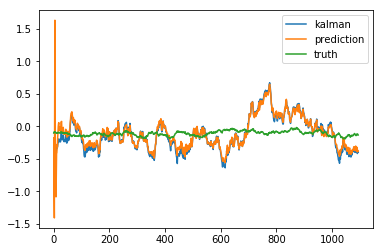

In [14]:
index=0
lbd = 1
sigma = 0.9
sigmaS= 0.1
deltaT= 1./365
kalman_result =  kalman.kalman_estimate( X[index, :,0] ,
                                 sigmaS =sigmaS ,
                                 lbd=lbd,
                                 sigmamu= sigma,
                                 deltaT=deltaT )
plt.plot(kalman_result, label='kalman' )
#plt.plot(X[index,:,0])
plt.plot( result[1][index,:,0] , label = 'prediction')
plt.plot( trends[1:,0] , label= 'truth')
plt.legend( loc='best')
plt.show()

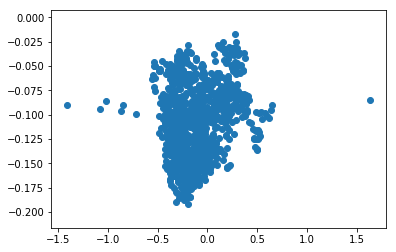

In [15]:
plt.scatter( result[1][0,:,0], trends[1:,0])
plt.show()

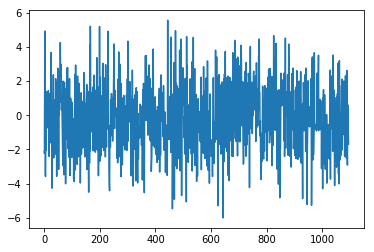

In [16]:
plt.plot(Y[0,:,0])
plt.show()